# Capstone Project Notebook for IBM Data Science Coursera #
## The Battle of Neighborhoods ##

In [1]:
# import libraries
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
from matplotlib import pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

import math

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    openssl-1.1.1f             |       h516909a_0         2.1 MB  conda-forge
    geopy-1.21.0               |             py_0          58 KB  conda-forge
    ca-certificates-2019.11.28 |       hecc5488_0         145 KB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    certifi-2019.11.28         |   py36h9f0ad1d_1         149 KB  conda-forge
    python_abi-3.6             |          1_cp36m           4 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0         conda-forge
    geopy:           1

In [2]:
# communes de l'agglomeration de Lyon
!wget -q -O 'adr_voie_lieu.adrcommune.json' https://www.data.gouv.fr/fr/datasets/r/dac5c361-566f-4e70-9dbd-187bae7bebbe
# quartiers/neighborhoods de l'agglomeration de Lyon
!wget -q -O 'adr_voie_lieu.adrquartier.json' https://www.data.gouv.fr/fr/datasets/r/d4095ad7-4aa1-4ef4-9b2a-d804201cea97
    
print('Data downloaded!')

Data downloaded!


In [3]:
with open('adr_voie_lieu.adrcommune.json') as json_data:
    commune_metropole_lyon_data = json.load(json_data)
with open('adr_voie_lieu.adrquartier.json') as json_data:
    quartier_metropole_lyon_data = json.load(json_data)

In [4]:
# create a map of the metropole of Lyon
latitude = 45.7640
longitude = 4.8357

In [5]:
lyon_map = folium.Map(location=[latitude, longitude], zoom_start=11)
# generate choropleth map using the neighporhoods
lyon_map.choropleth(
    geo_data=quartier_metropole_lyon_data,
    #data=df_,
    #columns=['', 'Total'],
    #key_on='feature.properties.name',
    #fill_color='YlOrRd', 
    #fill_opacity=0.7, 
    #line_opacity=0.2,
    #legend_name=' '
)

# display map
lyon_map

#### The neighborhoods seem to be not complete as we can see so let's have a look on the cities of the Metropole de Lyon

In [6]:
lyon_map = folium.Map(location=[latitude, longitude], zoom_start=10)
# generate choropleth map using the cities
lyon_map.choropleth(
    geo_data=commune_metropole_lyon_data,
    #data=df_,
    #columns=['', 'Total'],
    #key_on='feature.properties.name',
    #fill_color='YlOrRd', 
    #fill_opacity=0.7, 
    #line_opacity=0.2,
    #legend_name=' '
)

# display map
lyon_map

#### The cities of the Metropole de Lyon is too large so we keep the neighborhoods

In [7]:
neighborhoods_data = quartier_metropole_lyon_data['features']
#neighborhoods_data2 = commune_metropole_lyon_data['features']
neighborhoods_data[0]

{'type': 'Feature',
 'properties': {'gml_id': 'adr_voie_lieu.adrquartier.3193',
  'nom': 'Quartier Ménival Battières La Plaine',
  'theme': 'HABITAT',
  'soustheme': 'Quartier',
  'identifiant': 'S5315',
  'timePosition': '2010-10-05',
  'gid': 3193,
  'style': {'weight': 1,
   'opacity': 1,
   'color': 'black',
   'fillOpacity': 0.6,
   'fillColor': 'blue'},
  'highlight': {}},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[4.78098, 45.74593799905713],
    [4.781439, 45.74574899905712],
    [4.781695, 45.74563899905712],
    [4.782042, 45.745451999057124],
    [4.782309, 45.745280999057115],
    [4.782831, 45.74488299905711],
    [4.783327, 45.744474999057125],
    [4.783588, 45.744244999057116],
    [4.784152, 45.74451499905712],
    [4.784455, 45.744621999057124],
    [4.785474, 45.74510199905713],
    [4.786174, 45.745441999057114],
    [4.786461, 45.74559299905713],
    [4.78738, 45.746050999057125],
    [4.788338, 45.746477999057134],
    [4.78923, 45.74686699905713],
    [

#### As we see, the coordinates indicate the limit of the neighborhood and not it's centroid
#### so we will calculate the centroid to get the lat and long of the neighborhoods while creating our dataframe

In [8]:
# define the dataframe columns
column_names = ['Quartier','Lat','Long'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [9]:
for data in neighborhoods_data:
    neighborhood_name = data['properties']['nom']
       
    neighborhood_latlon = data['geometry']['coordinates'][0]
    neighborhood_lat = 0
    neighborhood_long = 0
    for coordonnee in neighborhood_latlon:
        neighborhood_lat = neighborhood_lat + coordonnee[1]
        neighborhood_long = neighborhood_long + coordonnee[0]
    neighborhood_lat = neighborhood_lat/ len(neighborhood_latlon)
    neighborhood_long = neighborhood_long / len(neighborhood_latlon)
    neighborhoods = neighborhoods.append({'Quartier': neighborhood_name,
                                          'Lat': neighborhood_lat,
                                          'Long': neighborhood_long}, ignore_index=True)


In [10]:
neighborhoods.head()

,Quartier,Lat,Long
0,Quartier Ménival Battières La Plaine,45.752027,4.783056
1,Quartier Colline des Funiculaires,45.755310,4.813213
2,Quartier Guillotière,45.748928,4.848702
3,Quartier Jean Macé,45.744234,4.848954
4,Quartier Vignettes Figuières,45.663543,4.854375


In [11]:
# create map of Lyon using latitude and longitude values
map_lyon = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, quartier in zip(neighborhoods['Lat'], neighborhoods['Long'], neighborhoods['Quartier']):
    label = '{}'.format(quartier)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#4B0082',
        fill_opacity=0.7,
        parse_html=False).add_to(map_lyon)  
    
map_lyon

#### Foursquare don't give us hospitals and education data, so we get these datas from another source

In [12]:
# hopitaux de l'agglomeration
!wget -q -O 'adr_voie_lieu.adrhopital.json' https://www.data.gouv.fr/fr/datasets/r/b91e429b-31cd-45ca-86e8-cc08157a0295
with open('adr_voie_lieu.adrhopital.json') as json_data:
    hopitaux_metropole_lyon_data = json.load(json_data)
# ecoles
!wget -q -O 'adr_voie_lieu.adrecolepct.json' https://www.data.gouv.fr/fr/datasets/r/46ca8505-e948-4bc6-aa39-b900b2d060cb
with open('adr_voie_lieu.adrecolepct.json') as json_data:
    ecoles_metropole_lyon_data = json.load(json_data)
# colleges
!wget -q -O 'adr_voie_lieu.adrcollegepct.json' https://www.data.gouv.fr/fr/datasets/r/1017b7df-74ff-4e93-bdc9-30a5e652e1fb
with open('adr_voie_lieu.adrcollegepct.json') as json_data:
    colleges_metropole_lyon_data = json.load(json_data)
# lycees
!wget -q -O 'adr_voie_lieu.adrlyceepct.json' https://www.data.gouv.fr/fr/datasets/r/2ef213fd-0247-4f01-9dcb-465893b1d9ed
with open('adr_voie_lieu.adrlyceepct.json') as json_data:
    lycees_metropole_lyon_data = json.load(json_data)

In [13]:
# define the dataframe columns
column_names = ['Hospital','Lat','Long'] 

# instantiate the dataframe
hospital = pd.DataFrame(columns=column_names)
# get the features
hospital_data = hopitaux_metropole_lyon_data['features']

for data in hospital_data:
    hospital_name = data['properties']['nom']
    hospital_lat = data['geometry']['coordinates'][1]
    hospital_long = data['geometry']['coordinates'][0]
    hospital = hospital.append({'Hospital': hospital_name,
                                          'Lat': hospital_lat,
                                          'Long': hospital_long}, ignore_index=True)
    

In [14]:
# define the dataframe columns
column_names = ['PrimarySchool','Lat','Long'] 

# instantiate the dataframe
primary_school = pd.DataFrame(columns=column_names)
# get the features
p_school_data = ecoles_metropole_lyon_data['features']

for data in p_school_data:
    primary_name = data['properties']['nom']
    primary_Lat = data['geometry']['coordinates'][1]
    primary_Long = data['geometry']['coordinates'][0]
    primary_school = primary_school.append({'PrimarySchool': primary_name,
                                          'Lat' : primary_Lat,
                                          'Long' : primary_Long}, ignore_index=True)

In [15]:
# define the dataframe columns
column_names = ['SecondarySchool','Lat','Long'] 

# instantiate the dataframe
secondary_school = pd.DataFrame(columns=column_names)
# get the features
s_school_data = colleges_metropole_lyon_data['features']

for data in s_school_data:
    secondary_name = data['properties']['nom']
    secondary_Lat = data['geometry']['coordinates'][1]
    secondary_Long = data['geometry']['coordinates'][0]
    secondary_school = secondary_school.append({'SecondarySchool': secondary_name,
                                          'Lat' : secondary_Lat,
                                          'Long' : secondary_Long}, ignore_index=True)

In [16]:
# define the dataframe columns
column_names = ['HighSchool','Lat','Long'] 

# instantiate the dataframe
high_school = pd.DataFrame(columns=column_names)
# get the features
h_school_data = lycees_metropole_lyon_data['features']

for data in h_school_data:
    high_name = data['properties']['nom']
    high_Lat = data['geometry']['coordinates'][1]
    high_Long = data['geometry']['coordinates'][0]
    high_school = high_school.append({'HighSchool': high_name,
                                          'Lat' : high_Lat,
                                          'Long' : high_Long}, ignore_index=True)

In [17]:
primary_school.head()

,PrimarySchool,Lat,Long
0,École primaire publique Hector Berlioz,45.685447,4.943867
1,Ecole Katherine Johnson,45.753315,4.923444
2,École élémentaire publique du Bourg,45.736313,4.762222
3,École maternelle publique Le Chater,45.736816,4.772596
4,École élémentaire publique Gilbert Billon,45.665687,4.821886


In [18]:
secondary_school.head()

,SecondarySchool,Lat,Long
0,Collège de la Tourette,45.773154,4.824791
1,Collège Paul-Emile Victor,45.817609,4.907099
2,Collège privé des Chassagnes,45.723136,4.808188
3,Collège privé Saint Charles,45.819598,4.893765
4,Collège privé Notre-Dame de Bellegarde,45.870511,4.841436


In [19]:
high_school.head()

,HighSchool,Lat,Long
0,Lycée général et technologique Condorcet,45.693620,4.942607
1,Lycée professionnel Tony Garnier,45.727107,4.888104
2,Lycée professionnel Alfred de Musset,45.756751,4.919960
3,Lycée général et technologique Jean-Paul Sartre,45.736373,4.921044
4,Lycée général et technologique Albert Camus,45.820795,4.910387


In [20]:
hospital.head()

,Hospital,Lat,Long
0,Hôpital Pierre Wertheimer,45.748972,4.898557
1,Hôpital d'Instruction des Armées Desgenettes,45.740663,4.890879
2,Hôpital Docteur Frédéric Dugoujon,45.786510,4.838869
3,Hôpital Antoine Charial,45.748615,4.752736
4,Hôpital de Sainte-Foy les Lyon,45.732358,4.793028


In [47]:
R = 6367445 #earth radius
# define the distance max where we count
def Educ_Care(DistanceMax):
    # define the dataframe columns
    column_names = ['Quartier','Neighborhood Latitude','Neighborhood Longitude','PrimarySchool','SecondarySchool','HighSchool','Hospital'] 

    # instantiate the dataframe
    Education_Care = pd.DataFrame(columns=column_names)
    Education_Care.head()
    # for each neighborhoods we look if hospital or school are in the radius and count it
    for ind in range(len(neighborhoods)):
        name = neighborhoods.iat[ind,0]
        latitude = neighborhoods.iat[ind,1]
        longitude = neighborhoods.iat[ind,2]
        a = math.radians(latitude)
        c = math.radians(longitude)
        for ind2 in hospital.index:
            b = math.radians(hospital['Lat'][ind2])
            d = math.radians(hospital['Long'][ind2])
            distance = R*math.acos(math.sin(a)*math.sin(b)+math.cos(a)*math.cos(b)*math.cos(c-d))
            if distance <= DistanceMax:
                df_temp = pd.DataFrame({"Quartier":[name],"Neighborhood Latitude":[latitude],"Neighborhood Longitude":[longitude],"PrimarySchool":[0],"SecondarySchool":[0],"HighSchool":[0],"Hospital":[1]})
                Education_Care = Education_Care.append(df_temp, ignore_index = True)
        for ind2 in high_school.index:
            b = math.radians(high_school['Lat'][ind2])
            d = math.radians(high_school['Long'][ind2])
            distance = R*math.acos(math.sin(a)*math.sin(b)+math.cos(a)*math.cos(b)*math.cos(c-d))
            if distance <= DistanceMax:
                df_temp = pd.DataFrame({"Quartier":[name],"Neighborhood Latitude":[latitude],"Neighborhood Longitude":[longitude],"PrimarySchool":[0],"SecondarySchool":[0],"HighSchool":[1],"Hospital":[0]})
                Education_Care = Education_Care.append(df_temp, ignore_index = True)
        for ind2 in secondary_school.index:
            b = math.radians(secondary_school['Lat'][ind2])
            d = math.radians(secondary_school['Long'][ind2])
            distance = R*math.acos(math.sin(a)*math.sin(b)+math.cos(a)*math.cos(b)*math.cos(c-d))
            if distance <= DistanceMax:
                df_temp = pd.DataFrame({"Quartier":[name],"Neighborhood Latitude":[latitude],"Neighborhood Longitude":[longitude],"PrimarySchool":[0],"SecondarySchool":[1],"HighSchool":[0],"Hospital":[0]})
                Education_Care = Education_Care.append(df_temp, ignore_index = True)
        for ind2 in high_school.index:
            b = math.radians(primary_school['Lat'][ind2])
            d = math.radians(primary_school['Long'][ind2])
            distance = R*math.acos(math.sin(a)*math.sin(b)+math.cos(a)*math.cos(b)*math.cos(c-d))
            if distance <= DistanceMax:
                df_temp = pd.DataFrame({"Quartier":[name],"Neighborhood Latitude":[latitude],"Neighborhood Longitude":[longitude],"PrimarySchool":[1],"SecondarySchool":[0],"HighSchool":[0],"Hospital":[0]})
                Education_Care = Education_Care.append(df_temp, ignore_index = True)

    return Education_Care

In [48]:
# now we define and calculate many  dataframe of education and care data for different radius
Education_Care_2000 = Educ_Care(2000)
Education_Care_2000.head()

,Quartier,Neighborhood Latitude,Neighborhood Longitude,PrimarySchool,SecondarySchool,HighSchool,Hospital
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
1,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
2,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
3,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
4,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1


In [49]:
Education_Care_1500 = Educ_Care(1500)
Education_Care_1500.head()

,Quartier,Neighborhood Latitude,Neighborhood Longitude,PrimarySchool,SecondarySchool,HighSchool,Hospital
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
1,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
2,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
3,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
4,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,1,0


In [50]:
Education_Care_1000 = Educ_Care(1000)
Education_Care_1000.head()

,Quartier,Neighborhood Latitude,Neighborhood Longitude,PrimarySchool,SecondarySchool,HighSchool,Hospital
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
1,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,1,0
2,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,1,0
3,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,1,0
4,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,1,0,0


In [51]:
Education_Care_750 = Educ_Care(750)
Education_Care_750.head()

,Quartier,Neighborhood Latitude,Neighborhood Longitude,PrimarySchool,SecondarySchool,HighSchool,Hospital
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,0,1
1,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,0,1,0
2,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,1,0,0
3,Quartier Ménival Battières La Plaine,45.752027,4.783056,1,0,0,0
4,Quartier Colline des Funiculaires,45.755310,4.813213,0,0,1,0


In [52]:
Education_Care_500 = Educ_Care(500)
Education_Care_500.head()

,Quartier,Neighborhood Latitude,Neighborhood Longitude,PrimarySchool,SecondarySchool,HighSchool,Hospital
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,1,0,0
1,Quartier Colline des Funiculaires,45.755310,4.813213,0,0,1,0
2,Quartier Colline des Funiculaires,45.755310,4.813213,0,1,0,0
3,Quartier Guillotière,45.748928,4.848702,0,0,1,0
4,Quartier Guillotière,45.748928,4.848702,0,1,0,0


In [53]:
Education_Care_250 = Educ_Care(250)
Education_Care_250.head()

,Quartier,Neighborhood Latitude,Neighborhood Longitude,PrimarySchool,SecondarySchool,HighSchool,Hospital
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,0,1,0,0
1,Quartier Guillotière,45.748928,4.848702,0,1,0,0
2,Quartier Jean Macé,45.744234,4.848954,0,0,0,1
3,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635,0,0,1,0
4,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635,0,1,0,0


#### Using Foursquare to get venues

In [30]:
# The code was removed by Watson Studio for sharing.

In [32]:
radius = 2000 #the distance max we use for education and care
LIMIT = 100
url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, radius, LIMIT)

In [33]:
results = requests.get(url).json()

In [34]:
neighborhoods.head()

,Quartier,Lat,Long
0,Quartier Ménival Battières La Plaine,45.752027,4.783056
1,Quartier Colline des Funiculaires,45.755310,4.813213
2,Quartier Guillotière,45.748928,4.848702
3,Quartier Jean Macé,45.744234,4.848954
4,Quartier Vignettes Figuières,45.663543,4.854375


In [35]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [36]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Le Musée,Lyonese Bouchon,45.764704,4.834464
1,Puzzle café,Café,45.764206,4.833891
2,Place des Cordeliers,Plaza,45.763526,4.836624
3,Les BeRThoM,Bar,45.767089,4.836439
4,Place de la Bourse,Plaza,45.764433,4.836463


In [37]:
from IPython.display import HTML
import base64 

In [38]:

def create_download_link( df, title = "Download CSV file", filename = "data.csv"):  
    csv = df.to_csv()
    b64 = base64.b64encode(csv.encode())
    payload = b64.decode()
    html = '<a download="{filename}" href="data:text/csv;base64,{payload}" target="_blank">{title}</a>'
    html = html.format(payload=payload,title=title,filename=filename)
    return HTML(html)

create_download_link(nearby_venues)

In [44]:
def getNearbyVenues2000(names, latitudes, longitudes):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        #print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            2000, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [45]:
lyon_venues_2000 = getNearbyVenues2000(names=neighborhoods['Quartier'],
                                   latitudes=neighborhoods['Lat'],
                                   longitudes=neighborhoods['Long']                                   
                                  )


In [46]:
lyon_venues_2000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,Place du Point du Jour,45.755987,4.797196,Plaza
1,Quartier Ménival Battières La Plaine,45.752027,4.783056,botanic®,45.736179,4.776750,Pet Store
2,Quartier Ménival Battières La Plaine,45.752027,4.783056,Gare SNCF d'Alaï,45.751825,4.771775,Train Station
3,Quartier Ménival Battières La Plaine,45.752027,4.783056,Gare SNCF d'Écully-la-Demi-Lune,45.765288,4.778996,Train Station
4,Quartier Ménival Battières La Plaine,45.752027,4.783056,Paul,45.756337,4.796933,Bakery


In [56]:
lyon_venues_2000.count()

Neighborhood              5767
Neighborhood Latitude     5767
Neighborhood Longitude    5767
Venue                     5767
Venue Latitude            5767
Venue Longitude           5767
Venue Category            5767
dtype: int64

In [57]:
#function to create the dataframe for different distances 1500, 1000, 750, 500, 250 base on the one of 2000

def lyon_venue_dist(distanceChosen):
    column_names = ['Neighborhood','Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']

    # instantiate the dataframe
    lyon_v = pd.DataFrame(columns=column_names)
    # for each ligne in lyon_venues_2000 we look if the venue is in radius of distanceChosen
    for ind in range(len(lyon_venues_2000)):
        name = lyon_venues_2000.iat[ind,0]
        latitude = lyon_venues_2000.iat[ind,1]
        longitude = lyon_venues_2000.iat[ind,2]
        a = math.radians(latitude)
        c = math.radians(longitude)
        v_name = lyon_venues_2000.iat[ind,3]
        v_lat = lyon_venues_2000.iat[ind,4]
        v_long = lyon_venues_2000.iat[ind,5]
        v_cat = lyon_venues_2000.iat[ind,6]
        b = math.radians(v_lat)
        d = math.radians(v_long)
        distance = R*math.acos(math.sin(a)*math.sin(b)+math.cos(a)*math.cos(b)*math.cos(c-d))
        if distance <= distanceChosen:
            df_temp = pd.DataFrame({"Neighborhood":[name],"Neighborhood Latitude":[latitude],"Neighborhood Longitude":[longitude],"Venue":[v_name],"Venue Latitude":[v_lat],"Venue Longitude":[v_long],"Venue Category":[v_cat]})
            lyon_v = lyon_v.append(df_temp, ignore_index = True)
    return lyon_v

In [58]:
#1500
lyon_venues_1500 = lyon_venue_dist(1500)
lyon_venues_1500.count()

Neighborhood              3268
Neighborhood Latitude     3268
Neighborhood Longitude    3268
Venue                     3268
Venue Latitude            3268
Venue Longitude           3268
Venue Category            3268
dtype: int64

In [59]:
#1000
lyon_venues_1000 = lyon_venue_dist(1000)
lyon_venues_1000.count()

Neighborhood              1654
Neighborhood Latitude     1654
Neighborhood Longitude    1654
Venue                     1654
Venue Latitude            1654
Venue Longitude           1654
Venue Category            1654
dtype: int64

In [60]:
#750
lyon_venues_750 = lyon_venue_dist(750)
lyon_venues_750.count()

Neighborhood              949
Neighborhood Latitude     949
Neighborhood Longitude    949
Venue                     949
Venue Latitude            949
Venue Longitude           949
Venue Category            949
dtype: int64

In [61]:
#500
lyon_venues_500 = lyon_venue_dist(500)
lyon_venues_500.count()

Neighborhood              453
Neighborhood Latitude     453
Neighborhood Longitude    453
Venue                     453
Venue Latitude            453
Venue Longitude           453
Venue Category            453
dtype: int64

In [62]:
#250
lyon_venues_250 = lyon_venue_dist(250)
lyon_venues_250.count()

Neighborhood              103
Neighborhood Latitude     103
Neighborhood Longitude    103
Venue                     103
Venue Latitude            103
Venue Longitude           103
Venue Category            103
dtype: int64

In [63]:
lyon_venues_2000.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Bussière,17,17,17,17,17,17
Cadière,19,19,19,19,19,19
Centre-ville,23,23,23,23,23,23
Chassagnes,40,40,40,40,40,40
Clavelière,19,19,19,19,19,19
Célestins - Merlo,14,14,14,14,14,14
Glacière,6,6,6,6,6,6
Golf - Montlouis,11,11,11,11,11,11
La Malletière,24,24,24,24,24,24


In [64]:
lyon_venues_1500.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Bussière,8,8,8,8,8,8
Cadière,9,9,9,9,9,9
Centre-ville,9,9,9,9,9,9
Chassagnes,15,15,15,15,15,15
Clavelière,8,8,8,8,8,8
Célestins - Merlo,6,6,6,6,6,6
Glacière,2,2,2,2,2,2
Golf - Montlouis,5,5,5,5,5,5
La Malletière,9,9,9,9,9,9


In [65]:
lyon_venues_1000.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Bussière,5,5,5,5,5,5
Cadière,4,4,4,4,4,4
Centre-ville,3,3,3,3,3,3
Chassagnes,4,4,4,4,4,4
Clavelière,6,6,6,6,6,6
Célestins - Merlo,3,3,3,3,3,3
Golf - Montlouis,3,3,3,3,3,3
La Malletière,4,4,4,4,4,4
Montmein,2,2,2,2,2,2


In [66]:
lyon_venues_750.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Bussière,3,3,3,3,3,3
Cadière,4,4,4,4,4,4
Centre-ville,3,3,3,3,3,3
Chassagnes,3,3,3,3,3,3
Clavelière,1,1,1,1,1,1
Célestins - Merlo,3,3,3,3,3,3
Golf - Montlouis,1,1,1,1,1,1
La Malletière,3,3,3,3,3,3
Montmein,1,1,1,1,1,1


In [67]:
lyon_venues_500.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Bussière,1,1,1,1,1,1
Cadière,4,4,4,4,4,4
Centre-ville,1,1,1,1,1,1
La Malletière,2,2,2,2,2,2
Quartier 2,1,1,1,1,1,1
Quartier Alagniers,2,2,2,2,2,2
Quartier Aragon,1,1,1,1,1,1
Quartier Arsenal,1,1,1,1,1,1
Quartier Aviation,4,4,4,4,4,4


In [68]:
lyon_venues_250.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Bussière,1,1,1,1,1,1
Centre-ville,1,1,1,1,1,1
Quartier Balmes La Garenne,1,1,1,1,1,1
Quartier Bas des Pentes Presqu'île,9,9,9,9,9,9
Quartier Bellecombe Village,1,1,1,1,1,1
Quartier Bellecour Carnot,2,2,2,2,2,2
Quartier Bellecour Cordeliers,12,12,12,12,12,12
Quartier Brotteaux,13,13,13,13,13,13
Quartier Centre,3,3,3,3,3,3


In [38]:
create_download_link(lyon_venues)

#### The venues categories are too large for our purpose so we create a top classification by analysing the different venue and their category

In [70]:
lyon_venues_2000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,Place du Point du Jour,45.755987,4.797196,Plaza
1,Quartier Ménival Battières La Plaine,45.752027,4.783056,botanic®,45.736179,4.776750,Pet Store
2,Quartier Ménival Battières La Plaine,45.752027,4.783056,Gare SNCF d'Alaï,45.751825,4.771775,Train Station
3,Quartier Ménival Battières La Plaine,45.752027,4.783056,Gare SNCF d'Écully-la-Demi-Lune,45.765288,4.778996,Train Station
4,Quartier Ménival Battières La Plaine,45.752027,4.783056,Paul,45.756337,4.796933,Bakery


In [71]:
# The code was removed by Watson Studio for sharing.

,Venue Category,Venue Type
0,Accessories Store,Shopping
1,Afghan Restaurant,Restaurant
2,Airport,Airport
3,American Restaurant,Restaurant
4,Amphitheater,Theater


In [79]:
lyon_venues2_2000 = pd.merge(lyon_venues_2000, VenuesClassification)
lyon_venues2_2000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Type
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,Place du Point du Jour,45.755987,4.797196,Plaza,Plaza
1,Quartier Ménival Battières La Plaine,45.752027,4.783056,Francheville Bel Air,45.748148,4.758256,Plaza,Plaza
2,Quartier Colline des Funiculaires,45.755310,4.813213,Place Saint-Jean,45.760945,4.826809,Plaza,Plaza
3,Quartier Colline des Funiculaires,45.755310,4.813213,Place Bellecour,45.757523,4.832397,Plaza,Plaza
4,Quartier Colline des Funiculaires,45.755310,4.813213,Place des Célestins,45.759804,4.831842,Plaza,Plaza


In [72]:
lyon_venues2_1500 = pd.merge(lyon_venues_1500, VenuesClassification)
lyon_venues2_1500.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Type
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,Place du Point du Jour,45.755987,4.797196,Plaza,Plaza
1,Quartier Colline des Funiculaires,45.755310,4.813213,Place Saint-Jean,45.760945,4.826809,Plaza,Plaza
2,Quartier Colline des Funiculaires,45.755310,4.813213,Place du Point du Jour,45.755987,4.797196,Plaza,Plaza
3,Quartier Guillotière,45.748928,4.848702,Place Gailleton,45.753390,4.833179,Plaza,Plaza
4,Quartier Guillotière,45.748928,4.848702,Place Guichard,45.759862,4.846812,Plaza,Plaza


In [73]:
lyon_venues2_1000 = pd.merge(lyon_venues_1000, VenuesClassification)
lyon_venues2_1000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Type
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,Gare SNCF d'Alaï,45.751825,4.771775,Train Station,Transportation
1,Quartier Vignettes Figuières,45.663543,4.854375,Gare SNCF de Feyzin,45.665946,4.852878,Train Station,Transportation
2,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635,Gare de Lyon-Brotteaux,45.767784,4.859171,Train Station,Transportation
3,Quartier Bandonniers Géraniums,45.665599,4.865089,Gare SNCF de Feyzin,45.665946,4.852878,Train Station,Transportation
4,Quartier Jules Guesde,45.710772,4.886712,Gare SNCF de Vénissieux,45.705093,4.888219,Train Station,Transportation


In [74]:
lyon_venues2_750 = pd.merge(lyon_venues_750, VenuesClassification)
lyon_venues2_750.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Type
0,Quartier Colline des Funiculaires,45.755310,4.813213,Fourvière Hôtel,45.758675,4.816625,Hotel,Hotel
1,Quartier Guillotière,45.748928,4.848702,Mama Shelter,45.746978,4.845037,Hotel,Hotel
2,Quartier Jean Macé,45.744234,4.848954,Mama Shelter,45.746978,4.845037,Hotel,Hotel
3,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635,"Mercure Lyon Charpennes, France",45.770732,4.863670,Hotel,Hotel
4,Quartier Villette Paul Bert,45.759544,4.869767,Mercure Lyon la Part Dieu,45.759603,4.861400,Hotel,Hotel


In [75]:
lyon_venues2_500 = pd.merge(lyon_venues_500, VenuesClassification)
lyon_venues2_500.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Type
0,Quartier Colline des Funiculaires,45.755310,4.813213,Fourvière Hôtel,45.758675,4.816625,Hotel,Hotel
1,Quartier Guillotière,45.748928,4.848702,Mama Shelter,45.746978,4.845037,Hotel,Hotel
2,Quartier Jean Macé,45.744234,4.848954,Mama Shelter,45.746978,4.845037,Hotel,Hotel
3,Quartier Sans-Souci Dauphiné,45.750499,4.871076,Aparthôtel Lagrange City Lyon Lumière,45.746811,4.869218,Hotel,Hotel
4,Quartier Centre Ville,45.583330,4.770804,Kyriad Lyon Sud - Givors,45.586800,4.771561,Hotel,Hotel


In [76]:
lyon_venues2_250 = pd.merge(lyon_venues_250, VenuesClassification)
lyon_venues2_250.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Type
0,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635,L'Appart Fitness,45.768365,4.869758,Gym / Fitness Center,Sport
1,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635,Les Terrasses d'Alex,45.770095,4.868465,French Restaurant,Restaurant
2,Quartier Mutualité Préfecture Moncey,45.758944,4.843683,Arsenic,45.759173,4.844649,French Restaurant,Restaurant
3,Quartier Croix-Rousse Est et Rhône,45.777801,4.836661,Le Canut et Les Gones,45.778459,4.834718,French Restaurant,Restaurant
4,Quartier Quartiers Anciens,45.757850,4.822706,Têtedoie,45.758923,4.823389,French Restaurant,Restaurant


In [80]:
create_download_link(lyon_venues2_2000)

In [83]:
#clearing some line of the dataframe
print(lyon_venues2_2000.count())
lyon_venues2_2000 = lyon_venues2_2000.loc[lyon_venues2_2000['Venue Type'] != 'A supprimer']
print(lyon_venues2_2000.count())
print(lyon_venues2_1500.count())
lyon_venues2_1500 = lyon_venues2_1500.loc[lyon_venues2_1500['Venue Type'] != 'A supprimer']
print(lyon_venues2_1500.count())
print(lyon_venues2_1000.count())
lyon_venues2_1000 = lyon_venues2_1000.loc[lyon_venues2_1000['Venue Type'] != 'A supprimer']
print(lyon_venues2_1000.count())
print(lyon_venues2_750.count())
lyon_venues2_750 = lyon_venues2_750.loc[lyon_venues2_750['Venue Type'] != 'A supprimer']
print(lyon_venues2_750.count())
print(lyon_venues2_500.count())
lyon_venues2_500 = lyon_venues2_500.loc[lyon_venues2_500['Venue Type'] != 'A supprimer']
print(lyon_venues2_500.count())
print(lyon_venues2_250.count())
lyon_venues2_250 = lyon_venues2_250.loc[lyon_venues2_250['Venue Type'] != 'A supprimer']
print(lyon_venues2_250.count())

Neighborhood              5552
Neighborhood Latitude     5552
Neighborhood Longitude    5552
Venue                     5552
Venue Latitude            5552
Venue Longitude           5552
Venue Category            5552
Venue Type                5552
dtype: int64
Neighborhood              5522
Neighborhood Latitude     5522
Neighborhood Longitude    5522
Venue                     5522
Venue Latitude            5522
Venue Longitude           5522
Venue Category            5522
Venue Type                5522
dtype: int64
Neighborhood              3158
Neighborhood Latitude     3158
Neighborhood Longitude    3158
Venue                     3158
Venue Latitude            3158
Venue Longitude           3158
Venue Category            3158
Venue Type                3158
dtype: int64
Neighborhood              3135
Neighborhood Latitude     3135
Neighborhood Longitude    3135
Venue                     3135
Venue Latitude            3135
Venue Longitude           3135
Venue Category            3135


In [84]:
def dfHotEncoding (lyon_venues2):
    # one hot encoding
    lyon_onehot = pd.get_dummies(lyon_venues2[['Venue Type']], prefix="", prefix_sep="")

    # add neighborhood, lat and long columns back to dataframe (because there doublon on neighborhood)
    lyon_onehot['Neighborhood'] = lyon_venues2['Neighborhood'] 
    lyon_onehot['Neighborhood Latitude'] = lyon_venues2['Neighborhood Latitude'] 
    lyon_onehot['Neighborhood Longitude'] = lyon_venues2['Neighborhood Longitude'] 

    return lyon_onehot

In [85]:
lyon_onehot_2000 = dfHotEncoding(lyon_venues2_2000)
lyon_onehot_2000.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,Historic Site,Hobbies,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,Public Art,Res,Rest Area,Restaurant,River,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo,Neighborhood,Neighborhood Latitude,Neighborhood Longitude
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Ménival Battières La Plaine,45.752027,4.783056
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Ménival Battières La Plaine,45.752027,4.783056
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Colline des Funiculaires,45.755310,4.813213
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Colline des Funiculaires,45.755310,4.813213
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Colline des Funiculaires,45.755310,4.813213


In [86]:
lyon_onehot_1500 = dfHotEncoding(lyon_venues2_1500)
lyon_onehot_1500.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,Historic Site,Hobbies,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,Public Art,Res,Rest Area,Restaurant,River,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo,Neighborhood,Neighborhood Latitude,Neighborhood Longitude
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Ménival Battières La Plaine,45.752027,4.783056
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Colline des Funiculaires,45.755310,4.813213
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Colline des Funiculaires,45.755310,4.813213
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Guillotière,45.748928,4.848702
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Guillotière,45.748928,4.848702


In [87]:
lyon_onehot_1000 = dfHotEncoding(lyon_venues2_1000)
lyon_onehot_1000.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,Historic Site,Hobbies,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,Public Art,Res,Rest Area,Restaurant,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo,Neighborhood,Neighborhood Latitude,Neighborhood Longitude
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Quartier Ménival Battières La Plaine,45.752027,4.783056
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Quartier Vignettes Figuières,45.663543,4.854375
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Quartier Bandonniers Géraniums,45.665599,4.865089
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Quartier Jules Guesde,45.710772,4.886712


In [88]:
lyon_onehot_750 = dfHotEncoding(lyon_venues2_750)
lyon_onehot_750.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,Historic Site,Hobbies,Hotel,Movie Theater,Museum,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,Public Art,Res,Rest Area,Restaurant,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo,Neighborhood,Neighborhood Latitude,Neighborhood Longitude
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Colline des Funiculaires,45.755310,4.813213
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Guillotière,45.748928,4.848702
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Jean Macé,45.744234,4.848954
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Villette Paul Bert,45.759544,4.869767


In [89]:
lyon_onehot_500 = dfHotEncoding(lyon_venues2_500)
lyon_onehot_500.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,Historic Site,Hobbies,Hotel,Movie Theater,Museum,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,Public Art,Res,Rest Area,Restaurant,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo,Neighborhood,Neighborhood Latitude,Neighborhood Longitude
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Colline des Funiculaires,45.755310,4.813213
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Guillotière,45.748928,4.848702
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Jean Macé,45.744234,4.848954
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Sans-Souci Dauphiné,45.750499,4.871076
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Quartier Centre Ville,45.583330,4.770804


In [90]:
lyon_onehot_250 = dfHotEncoding(lyon_venues2_250)
lyon_onehot_250.head()

,Auto,Bakery,Bar,Bookstore,Café,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Historic Site,Hobbies,Hotel,Movie Theater,Museum,Nightclub,Park,Pharmacy,Planetarium,Plaza,Restaurant,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo,Neighborhood,Neighborhood Latitude,Neighborhood Longitude
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Quartier Mutualité Préfecture Moncey,45.758944,4.843683
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Quartier Croix-Rousse Est et Rhône,45.777801,4.836661
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Quartier Quartiers Anciens,45.757850,4.822706


In [92]:
# before doing the mean we add hospital and education data
def concatenateLyonvenuesEducatuion (lyon_onehot, Education_Care):
    lyon_onehot["PrimarySchool"] = 0.0
    lyon_onehot["SecondarySchool"] = 0.0
    lyon_onehot["HighSchool"] = 0.0
    lyon_onehot["Hospital"] = 0.0

    Education_Care.rename(columns={'Quartier': 'Neighborhood'}, inplace=True)
    lyon_onehot = lyon_onehot.append(Education_Care, ignore_index = True)
    lyon_onehot.fillna(0.0, inplace =True)
    return lyon_onehot

In [93]:
lyon_onehot_2000 = concatenateLyonvenuesEducatuion(lyon_onehot_2000, Education_Care_2000)
lyon_onehot_1500 = concatenateLyonvenuesEducatuion(lyon_onehot_1500, Education_Care_1500)
lyon_onehot_1000 = concatenateLyonvenuesEducatuion(lyon_onehot_1000, Education_Care_1000)
lyon_onehot_750 = concatenateLyonvenuesEducatuion(lyon_onehot_750, Education_Care_750)
lyon_onehot_500 = concatenateLyonvenuesEducatuion(lyon_onehot_500, Education_Care_500)
lyon_onehot_250 = concatenateLyonvenuesEducatuion(lyon_onehot_250, Education_Care_250)


/opt/conda/envs/Python36/lib/python3.6/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


In [94]:
# preparing data for clustering
lyon_grouped_2000 = lyon_onehot_2000.groupby(by=['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']).mean().reset_index()
lyon_grouped_2000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,River,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,Bussière,45.717838,4.800616,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.022727,0.181818,0.0,0.045455,0.045455,0.045455,0.0,0.000000,0.0,0.000000,0.045455,0.0,0.0,0.0,0.0,0.0,0.000000,0.227273,0.0,0.000000,0.0,0.068182,0.0,0.204545,0.00000,0.045455,0.000000,0.0,0.022727,0.0,0.022727,0.022727,0.0
1,Cadière,45.722518,4.799395,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.022222,0.0,0.000000,0.022222,0.177778,0.0,0.022222,0.044444,0.044444,0.0,0.000000,0.0,0.000000,0.044444,0.0,0.0,0.0,0.0,0.0,0.022222,0.222222,0.0,0.000000,0.0,0.066667,0.0,0.200000,0.00000,0.022222,0.022222,0.0,0.022222,0.0,0.022222,0.022222,0.0
2,Centre-ville,45.715471,4.805604,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.040000,0.160000,0.0,0.040000,0.020000,0.040000,0.0,0.000000,0.0,0.000000,0.040000,0.0,0.0,0.0,0.0,0.0,0.000000,0.240000,0.0,0.000000,0.0,0.100000,0.0,0.160000,0.02000,0.020000,0.040000,0.0,0.020000,0.0,0.020000,0.040000,0.0
3,Chassagnes,45.721263,4.808291,0.0,0.0,0.0,0.015873,0.0,0.015873,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.031746,0.015873,0.126984,0.0,0.015873,0.015873,0.063492,0.0,0.015873,0.0,0.015873,0.031746,0.0,0.0,0.0,0.0,0.0,0.000000,0.158730,0.0,0.015873,0.0,0.174603,0.0,0.142857,0.00000,0.031746,0.047619,0.0,0.015873,0.0,0.031746,0.015873,0.0
4,Clavelière,45.708899,4.814011,0.0,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.071429,0.0,0.000000,0.0,0.000000,0.000000,0.142857,0.0,0.047619,0.023810,0.023810,0.0,0.000000,0.0,0.000000,0.047619,0.0,0.0,0.0,0.0,0.0,0.000000,0.214286,0.0,0.000000,0.0,0.119048,0.0,0.166667,0.02381,0.000000,0.047619,0.0,0.023810,0.0,0.000000,0.047619,0.0


In [95]:
lyon_grouped_1500 = lyon_onehot_1500.groupby(by=['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']).mean().reset_index()
lyon_grouped_1500.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,River,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,Bussière,45.717838,4.800616,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.035714,0.214286,0.0,0.000000,0.000000,0.035714,0.0,0.0,0.0,0.0,0.035714,0.0,0.0,0.0,0.0,0.0,0.0,0.321429,0.0,0.0,0.0,0.071429,0.0,0.178571,0.0,0.035714,0.000000,0.0,0.035714,0.0,0.000000,0.035714,0.0
1,Cadière,45.722518,4.799395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.034483,0.241379,0.0,0.000000,0.034483,0.034483,0.0,0.0,0.0,0.0,0.034483,0.0,0.0,0.0,0.0,0.0,0.0,0.241379,0.0,0.0,0.0,0.034483,0.0,0.241379,0.0,0.034483,0.000000,0.0,0.034483,0.0,0.000000,0.034483,0.0
2,Centre-ville,45.715471,4.805604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.032258,0.193548,0.0,0.032258,0.032258,0.032258,0.0,0.0,0.0,0.0,0.032258,0.0,0.0,0.0,0.0,0.0,0.0,0.322581,0.0,0.0,0.0,0.064516,0.0,0.161290,0.0,0.032258,0.000000,0.0,0.032258,0.0,0.000000,0.032258,0.0
3,Chassagnes,45.721263,4.808291,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.027027,0.216216,0.0,0.027027,0.000000,0.054054,0.0,0.0,0.0,0.0,0.054054,0.0,0.0,0.0,0.0,0.0,0.0,0.189189,0.0,0.0,0.0,0.054054,0.0,0.216216,0.0,0.027027,0.054054,0.0,0.027027,0.0,0.027027,0.027027,0.0
4,Clavelière,45.708899,4.814011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.185185,0.0,0.037037,0.037037,0.037037,0.0,0.0,0.0,0.0,0.037037,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.111111,0.0,0.148148,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.074074,0.0


In [96]:
lyon_grouped_1000 = lyon_onehot_1000.groupby(by=['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']).mean().reset_index()
lyon_grouped_1000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,Bussière,45.717838,4.800616,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.050000,0.250000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.050000,0.0,0.0,0.0,0.0,0.0,0.0,0.300000,0.0,0.0,0.0,0.050000,0.200000,0.0,0.050000,0.0,0.0,0.050000,0.0,0.0,0.000000,0.0
1,Cadière,45.722518,4.799395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.071429,0.214286,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.285714,0.0,0.0,0.0,0.071429,0.214286,0.0,0.071429,0.0,0.0,0.071429,0.0,0.0,0.000000,0.0
2,Centre-ville,45.715471,4.805604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.333333,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.055556,0.0,0.0,0.0,0.0,0.0,0.0,0.333333,0.0,0.0,0.0,0.055556,0.166667,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.055556,0.0
3,Chassagnes,45.721263,4.808291,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.285714,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.071429,0.0,0.0,0.0,0.0,0.0,0.0,0.357143,0.0,0.0,0.0,0.071429,0.142857,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.071429,0.0
4,Clavelière,45.708899,4.814011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.176471,0.0,0.0,0.058824,0.058824,0.0,0.0,0.0,0.0,0.058824,0.0,0.0,0.0,0.0,0.0,0.0,0.294118,0.0,0.0,0.0,0.117647,0.117647,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.117647,0.0


In [97]:
lyon_grouped_750 = lyon_onehot_750.groupby(by=['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']).mean().reset_index()
lyon_grouped_750.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,Bussière,45.717838,4.800616,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.125000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.125000,0.0,0.0,0.0,0.0,0.0,0.0,0.375000,0.0,0.0,0.0,0.125000,0.125000,0.0,0.000,0.0,0.0,0.125,0.0,0.0,0.000000,0.0
1,Cadière,45.722518,4.799395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.125,0.250000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.125000,0.0,0.0,0.0,0.125000,0.125000,0.0,0.125,0.0,0.0,0.125,0.0,0.0,0.000000,0.0
2,Centre-ville,45.715471,4.805604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.307692,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.076923,0.0,0.0,0.0,0.0,0.0,0.0,0.307692,0.0,0.0,0.0,0.076923,0.153846,0.0,0.000,0.0,0.0,0.000,0.0,0.0,0.076923,0.0
3,Chassagnes,45.721263,4.808291,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.400000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.100000,0.0,0.0,0.0,0.0,0.0,0.0,0.200000,0.0,0.0,0.0,0.100000,0.100000,0.0,0.000,0.0,0.0,0.000,0.0,0.0,0.100000,0.0
4,Clavelière,45.708899,4.814011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.285714,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.285714,0.0,0.0,0.0,0.142857,0.285714,0.0,0.000,0.0,0.0,0.000,0.0,0.0,0.000000,0.0


In [98]:
lyon_grouped_500 = lyon_onehot_500.groupby(by=['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']).mean().reset_index()
lyon_grouped_500.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,Bussière,45.717838,4.800616,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.666667,0.0,0.0,0.0,0.333333,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Cadière,45.722518,4.799395,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.200000,0.0,0.0,0.0,0.200000,0.00,0.0,0.2,0.0,0.0,0.2,0.0,0.0,0.0,0.0
2,Centre-ville,45.715471,4.805604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.600000,0.0,0.0,0.0,0.000000,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Chassagnes,45.721263,4.808291,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Clavelière,45.708899,4.814011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [99]:
lyon_grouped_250 = lyon_onehot_250.groupby(by=['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']).mean().reset_index()
lyon_grouped_250.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Auto,Bakery,Bar,Bookstore,Café,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Nightclub,Park,Pharmacy,Planetarium,Plaza,PrimarySchool,Restaurant,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,Bussière,45.717838,4.800616,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.5,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,Centre-ville,45.715471,4.805604,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.0,0.0,0.0,0.5,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,Chassagnes,45.721263,4.808291,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.75,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,Clavelière,45.708899,4.814011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Glacière,45.712146,4.796509,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [100]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[3:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [102]:
def topVenues(lyon_grouped):
    num_top_venues = 10

    indicators = ['st', 'nd', 'rd']

    # create columns according to number of top venues
    columns = ['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']
    for ind in np.arange(num_top_venues):
        try:
            columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
        except:
            columns.append('{}th Most Common Venue'.format(ind+1))

    # create a new dataframe
    neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
    neighborhoods_venues_sorted['Neighborhood'] = lyon_grouped['Neighborhood']
    neighborhoods_venues_sorted['Neighborhood Latitude'] = lyon_grouped['Neighborhood Latitude']
    neighborhoods_venues_sorted['Neighborhood Longitude'] = lyon_grouped['Neighborhood Longitude']

    for ind in np.arange(lyon_grouped.shape[0]):
        neighborhoods_venues_sorted.iloc[ind, 3:] = return_most_common_venues(lyon_grouped.iloc[ind, :], num_top_venues)

    return neighborhoods_venues_sorted

In [103]:
neighborhoods_venues_sorted_2000 = topVenues(lyon_grouped_2000)
neighborhoods_venues_sorted_2000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bussière,45.717838,4.800616,PrimarySchool,SecondarySchool,HighSchool,Restaurant,Shopping,Hobbies,Park,Hospital,Hotel,Transportation
1,Cadière,45.722518,4.799395,PrimarySchool,SecondarySchool,HighSchool,Restaurant,Hospital,Hotel,Park,Harbor / Marina,Transportation,FoodStore
2,Centre-ville,45.715471,4.805604,PrimarySchool,SecondarySchool,HighSchool,Restaurant,Hotel,Harbor / Marina,Transportation,Park,Hobbies,Sport
3,Chassagnes,45.721263,4.808291,Restaurant,PrimarySchool,SecondarySchool,HighSchool,Hotel,Sport,Theater,Gas Station,Shopping,Park
4,Clavelière,45.708899,4.814011,PrimarySchool,SecondarySchool,HighSchool,Restaurant,Fast Food Restaurant,Sport,Transportation,Park,Hobbies,Supermarket


In [104]:
neighborhoods_venues_sorted_1500 = topVenues(lyon_grouped_1500)
neighborhoods_venues_sorted_1500.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bussière,45.717838,4.800616,PrimarySchool,HighSchool,SecondarySchool,Restaurant,Hotel,Supermarket,Transportation,Shopping,Park,Harbor / Marina
1,Cadière,45.722518,4.799395,SecondarySchool,PrimarySchool,HighSchool,Hotel,Hospital,Restaurant,Harbor / Marina,Park,Shopping,Transportation
2,Centre-ville,45.715471,4.805604,PrimarySchool,HighSchool,SecondarySchool,Restaurant,Hotel,Hospital,Harbor / Marina,Park,Shopping,Transportation
3,Chassagnes,45.721263,4.808291,SecondarySchool,HighSchool,PrimarySchool,Hotel,Sport,Restaurant,Park,Hobbies,Theater,Supermarket
4,Clavelière,45.708899,4.814011,PrimarySchool,HighSchool,SecondarySchool,Restaurant,Transportation,Hospital,Hobbies,Park,Hotel,Historic Site


In [105]:
neighborhoods_venues_sorted_1000 = topVenues(lyon_grouped_1000)
neighborhoods_venues_sorted_1000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bussière,45.717838,4.800616,PrimarySchool,HighSchool,SecondarySchool,Supermarket,Harbor / Marina,Park,Shopping,Restaurant,Zoo,Fast Food Restaurant
1,Cadière,45.722518,4.799395,PrimarySchool,HighSchool,SecondarySchool,Supermarket,Harbor / Marina,Shopping,Restaurant,Zoo,Fast Food Restaurant,Hobbies
2,Centre-ville,45.715471,4.805604,PrimarySchool,HighSchool,SecondarySchool,Transportation,Park,Restaurant,Zoo,Hobbies,Historic Site,Harbor / Marina
3,Chassagnes,45.721263,4.808291,PrimarySchool,HighSchool,SecondarySchool,Transportation,Park,Restaurant,Zoo,Hobbies,Historic Site,Harbor / Marina
4,Clavelière,45.708899,4.814011,PrimarySchool,HighSchool,Transportation,SecondarySchool,Restaurant,Hospital,Park,Hotel,Flea Market,Hobbies


In [106]:
neighborhoods_venues_sorted_750 = topVenues(lyon_grouped_750)
neighborhoods_venues_sorted_750.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bussière,45.717838,4.800616,PrimarySchool,HighSchool,Supermarket,Park,SecondarySchool,Restaurant,Zoo,Historic Site,Harbor / Marina,Gas Station
1,Cadière,45.722518,4.799395,HighSchool,Supermarket,Harbor / Marina,Shopping,SecondarySchool,Restaurant,PrimarySchool,Zoo,Farmers Market,Historic Site
2,Centre-ville,45.715471,4.805604,PrimarySchool,HighSchool,SecondarySchool,Transportation,Park,Restaurant,Zoo,Historic Site,Harbor / Marina,Gas Station
3,Chassagnes,45.721263,4.808291,HighSchool,PrimarySchool,Transportation,Park,SecondarySchool,Restaurant,Zoo,Historic Site,Harbor / Marina,Gas Station
4,Clavelière,45.708899,4.814011,HighSchool,SecondarySchool,PrimarySchool,Restaurant,Zoo,Fast Food Restaurant,Hobbies,Historic Site,Harbor / Marina,Gas Station


In [107]:
neighborhoods_venues_sorted_500 = topVenues(lyon_grouped_500)
neighborhoods_venues_sorted_500.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bussière,45.717838,4.800616,PrimarySchool,Restaurant,Zoo,Flea Market,Hospital,Hobbies,Historic Site,HighSchool,Harbor / Marina,Gas Station
1,Cadière,45.722518,4.799395,PrimarySchool,Supermarket,Harbor / Marina,Shopping,Restaurant,Zoo,Hobbies,Historic Site,HighSchool,Gas Station
2,Centre-ville,45.715471,4.805604,PrimarySchool,Park,SecondarySchool,Zoo,Flea Market,Hobbies,Historic Site,HighSchool,Harbor / Marina,Gas Station
3,Chassagnes,45.721263,4.808291,HighSchool,SecondarySchool,Zoo,Fast Food Restaurant,Hospital,Hobbies,Historic Site,Harbor / Marina,Gas Station,Garden
4,Clavelière,45.708899,4.814011,HighSchool,SecondarySchool,Zoo,Fast Food Restaurant,Hospital,Hobbies,Historic Site,Harbor / Marina,Gas Station,Garden


In [108]:
neighborhoods_venues_sorted_250 = topVenues(lyon_grouped_250)
neighborhoods_venues_sorted_250.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bussière,45.717838,4.800616,PrimarySchool,Restaurant,Zoo,FoodStore,Hospital,Hobbies,Historic Site,HighSchool,Flea Market,Movie Theater
1,Centre-ville,45.715471,4.805604,Park,PrimarySchool,Zoo,FoodStore,Hospital,Hobbies,Historic Site,HighSchool,Flea Market,Movie Theater
2,Chassagnes,45.721263,4.808291,HighSchool,SecondarySchool,Zoo,Hotel,Hospital,Hobbies,Historic Site,FoodStore,Flea Market,Museum
3,Clavelière,45.708899,4.814011,SecondarySchool,Zoo,Hotel,Hospital,Hobbies,Historic Site,HighSchool,FoodStore,Flea Market,Museum
4,Glacière,45.712146,4.796509,PrimarySchool,Zoo,FoodStore,Hotel,Hospital,Hobbies,Historic Site,HighSchool,Flea Market,Museum


## CLUSTERING

In [124]:
# looking for the best number of clusters
def Elbow(lyon_grouped, distance):
    lyon_grouped_clustering = lyon_grouped.drop('Neighborhood', 1)
    lyon_grouped_clustering = lyon_grouped_clustering.drop('Neighborhood Latitude', 1)
    lyon_grouped_clustering = lyon_grouped_clustering.drop('Neighborhood Longitude', 1)

    # using the elbow method
    Sum_of_squared_distances = []
    K = range(1,15)
    for k in K:
        km = KMeans(n_clusters=k, random_state=0)
        km = km.fit(lyon_grouped_clustering)
        Sum_of_squared_distances.append(km.inertia_)

    # plot the result to decide wich number will be fine
    plt.plot(K, Sum_of_squared_distances, 'bx-')
    plt.xlabel('k')
    plt.ylabel('Sum_of_squared_distances')
    plt.title('Elbow Method For Optimal k  with radius ' + distance)
    plt.show()

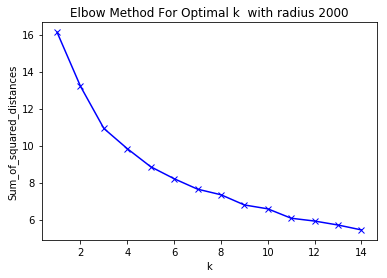

In [128]:
Elbow(lyon_grouped_2000, "2000")

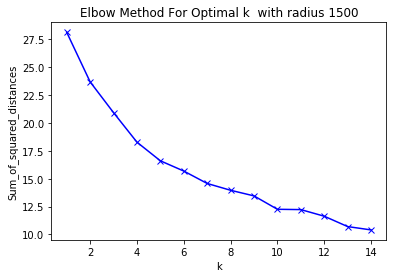

In [129]:
Elbow(lyon_grouped_1500, "1500")

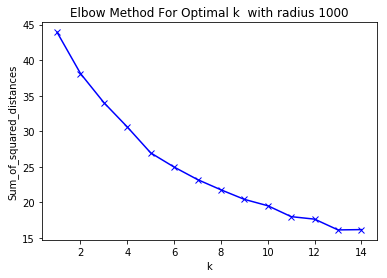

In [130]:
Elbow(lyon_grouped_1000, "1000")

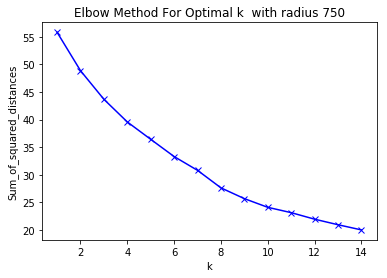

In [131]:
Elbow(lyon_grouped_750, "750")

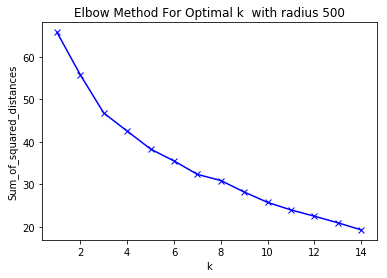

In [132]:
Elbow(lyon_grouped_500, "500")

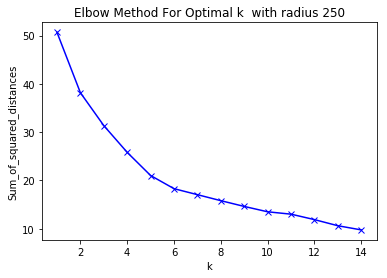

In [133]:
Elbow(lyon_grouped_250, "250")

In [141]:
# Clustering with the number of clusters we chose and return the datafame merged
def clustering(neighborhoods_venues_sorted, lyon_grouped, k):
    lyon_grouped_clustering = lyon_grouped.drop('Neighborhood', 1)
    lyon_grouped_clustering = lyon_grouped_clustering.drop('Neighborhood Latitude', 1)
    lyon_grouped_clustering = lyon_grouped_clustering.drop('Neighborhood Longitude', 1)

    kclusters = k
    km = KMeans(n_clusters=kclusters, random_state=0)
    km = km.fit(lyon_grouped_clustering)
    # add clustering labels
    neighborhoods_venues_sorted.insert(0, 'Cluster Labels', km.labels_)
    lyon_merged = neighborhoods
    lyon_merged.rename(columns={'Quartier': 'Neighborhood'}, inplace=True)
    lyon_merged.rename(columns={'Lat': 'Neighborhood Latitude'}, inplace=True)
    lyon_merged.rename(columns={'Long': 'Neighborhood Longitude'}, inplace=True)

    lyon_merged.set_index(['Neighborhood','Neighborhood Latitude','Neighborhood Longitude'])

    # merge with neighborhoods_venues
    lyon_merged = lyon_merged.join(neighborhoods_venues_sorted.set_index(['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']), on=['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude'])
    # drop neighborhoods with no venue at all
    lyon_merged = lyon_merged.loc[lyon_merged['1st Most Common Venue'] != '0']
    lyon_merged.dropna(inplace = True)
    return lyon_merged

In [136]:
lyon_merged_2000 = clustering(neighborhoods_venues_sorted_2000, lyon_grouped_2000, 4)
lyon_merged_2000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,1,Hospital,PrimarySchool,SecondarySchool,HighSchool,Transportation,Plaza,FoodStore,Restaurant,Services,Shopping
1,Quartier Colline des Funiculaires,45.755310,4.813213,3,Restaurant,HighSchool,Bar,SecondarySchool,PrimarySchool,Hotel,TakeAway,Plaza,Hospital,Café
2,Quartier Guillotière,45.748928,4.848702,3,Restaurant,HighSchool,Hotel,Bar,Plaza,SecondarySchool,Café,Theater,Shopping,PrimarySchool
3,Quartier Jean Macé,45.744234,4.848954,3,HighSchool,Restaurant,SecondarySchool,Hotel,PrimarySchool,Plaza,Bar,Hospital,FoodStore,Supermarket
4,Quartier Vignettes Figuières,45.663543,4.854375,0,Services,Gas Station,Theater,Transportation,SecondarySchool,Restaurant,Rest Area,Hotel,Zoo,Flea Market


In [140]:
lyon_merged_1500 = clustering(neighborhoods_venues_sorted_1500, lyon_grouped_1500, 5)
lyon_merged_1500.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,2.0,PrimarySchool,SecondarySchool,Hospital,HighSchool,Restaurant,FoodStore,Fast Food Restaurant,Pharmacy,Farmers Market,Transportation
1,Quartier Colline des Funiculaires,45.755310,4.813213,1.0,Restaurant,HighSchool,SecondarySchool,Bar,Hospital,Hotel,Café,PrimarySchool,TakeAway,Historic Site
2,Quartier Guillotière,45.748928,4.848702,1.0,Restaurant,HighSchool,Bar,Hotel,SecondarySchool,Theater,Hospital,Plaza,TakeAway,Café
3,Quartier Jean Macé,45.744234,4.848954,1.0,HighSchool,Restaurant,Bar,PrimarySchool,SecondarySchool,Hospital,Plaza,Hotel,Park,Café
4,Quartier Vignettes Figuières,45.663543,4.854375,4.0,Services,Hotel,Theater,Transportation,SecondarySchool,Gas Station,Flea Market,Hospital,Hobbies,Historic Site


In [142]:
lyon_merged_1000 = clustering(neighborhoods_venues_sorted_1000, lyon_grouped_1000, 5)

TypeError: 'DataFrame' object is not callable

In [143]:
lyon_merged_1000.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,4.0,PrimarySchool,HighSchool,SecondarySchool,Hospital,Transportation,Supermarket,FoodStore,Fast Food Restaurant,Hobbies,Historic Site
1,Quartier Colline des Funiculaires,45.755310,4.813213,4.0,HighSchool,SecondarySchool,Hospital,Historic Site,Bar,Hotel,Restaurant,Garden,Flea Market,Hobbies
2,Quartier Guillotière,45.748928,4.848702,1.0,HighSchool,Restaurant,Bar,SecondarySchool,Hospital,Plaza,Café,Park,Hotel,PrimarySchool
3,Quartier Jean Macé,45.744234,4.848954,4.0,HighSchool,Restaurant,SecondarySchool,Bar,Hospital,Plaza,Café,Park,Hotel,PrimarySchool
4,Quartier Vignettes Figuières,45.663543,4.854375,4.0,Transportation,Hotel,SecondarySchool,Flea Market,Hospital,Hobbies,Historic Site,HighSchool,Harbor / Marina,Gas Station


In [144]:
lyon_merged_750 = clustering(neighborhoods_venues_sorted_750, lyon_grouped_750, 6)
lyon_merged_750.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,4.0,Hospital,HighSchool,SecondarySchool,PrimarySchool,Zoo,Flea Market,Hobbies,Historic Site,Harbor / Marina,Gas Station
1,Quartier Colline des Funiculaires,45.755310,4.813213,4.0,HighSchool,SecondarySchool,Historic Site,Hotel,Garden,Fast Food Restaurant,Hospital,Hobbies,Harbor / Marina,Gas Station
2,Quartier Guillotière,45.748928,4.848702,1.0,Restaurant,HighSchool,SecondarySchool,Hotel,Plaza,Bar,Café,Park,Hospital,PrimarySchool
3,Quartier Jean Macé,45.744234,4.848954,4.0,HighSchool,Hotel,Park,SecondarySchool,Restaurant,Plaza,Hospital,PrimarySchool,Flea Market,Hobbies
4,Quartier Vignettes Figuières,45.663543,4.854375,5.0,Transportation,Zoo,Flea Market,Hotel,Hospital,Hobbies,Historic Site,HighSchool,Harbor / Marina,Gas Station


In [145]:
lyon_merged_500 = clustering(neighborhoods_venues_sorted_500, lyon_grouped_500, 6)
lyon_merged_500.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,2.0,SecondarySchool,Zoo,Fast Food Restaurant,Hospital,Hobbies,Historic Site,HighSchool,Harbor / Marina,Gas Station,Garden
1,Quartier Colline des Funiculaires,45.755310,4.813213,4.0,Hotel,HighSchool,SecondarySchool,Fast Food Restaurant,Hospital,Hobbies,Historic Site,Harbor / Marina,Gas Station,Garden
2,Quartier Guillotière,45.748928,4.848702,0.0,Restaurant,PrimarySchool,HighSchool,SecondarySchool,Hotel,Zoo,Hobbies,Historic Site,Harbor / Marina,Gas Station
3,Quartier Jean Macé,45.744234,4.848954,4.0,Hospital,Park,HighSchool,SecondarySchool,PrimarySchool,Hotel,Flea Market,Hobbies,Historic Site,Harbor / Marina
4,Quartier Vignettes Figuières,45.663543,4.854375,0.0,Transportation,Zoo,Flea Market,Hotel,Hospital,Hobbies,Historic Site,HighSchool,Harbor / Marina,Gas Station


In [146]:
lyon_merged_250 = clustering(neighborhoods_venues_sorted_250, lyon_grouped_250, 5)
lyon_merged_250.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Quartier Ménival Battières La Plaine,45.752027,4.783056,4.0,SecondarySchool,Zoo,Hotel,Hospital,Hobbies,Historic Site,HighSchool,FoodStore,Flea Market,Museum
2,Quartier Guillotière,45.748928,4.848702,4.0,SecondarySchool,Zoo,Hotel,Hospital,Hobbies,Historic Site,HighSchool,FoodStore,Flea Market,Museum
3,Quartier Jean Macé,45.744234,4.848954,0.0,Hospital,Zoo,Museum,Bakery,Bar,Bookstore,Café,Farmers Market,Fast Food Restaurant,Flea Market
5,Quartier Gratte-Ciel Dedieu Charmettes,45.768305,4.869635,3.0,SecondarySchool,Restaurant,HighSchool,Sport,Hospital,Hobbies,Historic Site,FoodStore,Flea Market,Zoo
9,Quartier Les Vernes,45.605012,4.761086,2.0,PrimarySchool,Zoo,FoodStore,Hotel,Hospital,Hobbies,Historic Site,HighSchool,Flea Market,Museum


In [228]:
 def map_of_clusters(lyon_merged, kclusters):
    # create map
    map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

    # set color scheme for the clusters
    x = np.arange(kclusters)
    ys = [i + x + (i*x)**2 for i in range(kclusters)]
    rainbow = ['red','orange','yellow','darkgreen','navy','purple']

    # add markers to the map
    markers_colors = []
    for lat, lon, poi, cluster in zip(lyon_merged['Neighborhood Latitude'], lyon_merged['Neighborhood Longitude'], lyon_merged['Neighborhood'], lyon_merged['Cluster Labels']):
        label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[int(cluster)],
            fill=True,
            fill_color=rainbow[int(cluster)],
            fill_opacity=0.7).add_to(map_clusters)

    return map_clusters

In [229]:
map_of_clusters(lyon_merged_2000, 4)

In [230]:
map_of_clusters(lyon_merged_1500, 5)

In [231]:
map_of_clusters(lyon_merged_1000, 5)

In [232]:
map_of_clusters(lyon_merged_750, 6)

In [233]:
map_of_clusters(lyon_merged_500, 6)

In [234]:
map_of_clusters(lyon_merged_250, 5)

In [157]:
create_download_link(lyon_merged_2000)

In [158]:
create_download_link(lyon_merged_1500)

In [159]:
create_download_link(lyon_merged_1000)

In [160]:
create_download_link(lyon_merged_750)

In [161]:
create_download_link(lyon_merged_500)

In [162]:
create_download_link(lyon_merged_250)

# RESULTS ANALYSING

In [173]:
def create_groupe4(lyon_onehot, lyon_merged):    # dataframe for analysing results
    lyon_grouped2 = lyon_onehot.groupby(['Neighborhood','Neighborhood Latitude','Neighborhood Longitude']).sum().reset_index()
    lyon_groupe3 = pd.merge(lyon_grouped2, lyon_merged, how='outer', on = ['Neighborhood','Neighborhood Latitude','Neighborhood Longitude'])
    cols = ['Cluster Labels']  + [col for col in lyon_groupe3 if col != 'Cluster Labels']
    lyon_groupe3 = lyon_groupe3[cols]
    lyon_groupe4 = lyon_groupe3.groupby(['Cluster Labels']).sum().reset_index()
    lyon_groupe4.drop('Cluster Labels',1, inplace = True)
    lyon_groupe4.drop('Neighborhood Latitude',1, inplace = True)
    lyon_groupe4.drop('Neighborhood Longitude',1, inplace = True)
    return lyon_groupe4

def group_over (lyon_groupe4, maxi):
    lyon_groupe_plus = lyon_groupe4.copy()
    for colonne in list(lyon_groupe4):
        if lyon_groupe4[colonne].sum()< maxi:
            lyon_groupe_plus.drop(colonne, 1, inplace=True)
    return lyon_groupe_plus
def group_beetween (lyon_groupe4, mini, maxi):
    lyon_groupe_beetween = lyon_groupe4.copy()
    for colonne in list(lyon_groupe4):
        if (lyon_groupe4[colonne].sum()>= maxi or lyon_groupe4[colonne].sum()<mini):
            lyon_groupe_beetween.drop(colonne, 1, inplace=True)
    return lyon_groupe_beetween
def group_less (lyon_groupe4, mini):
    lyon_groupe_moins = lyon_groupe4.copy()
    for colonne in list(lyon_groupe4):
        if (lyon_groupe4[colonne].sum()>= mini):
            lyon_groupe_moins.drop(colonne, 1, inplace=True)        
    return lyon_groupe_moins

In [165]:
lyon_groupe4_2000 = create_groupe4(lyon_onehot_2000, lyon_merged_2000)
lyon_groupe4_2000.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,River,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,5.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,3.0,7.0,5.0,0.0,4.0,0.0,0.0,1.0,14.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,0.0,0.0,1.0,0.0,3.0,0.0,2.0,1.0,11.0,0.0,15.0,44.0,6.0,1.0,0.0,2.0,1.0,4.0,20.0,0.0
1,1.0,4.0,26.0,18.0,1.0,8.0,1.0,0.0,2.0,7.0,80.0,12.0,52.0,8.0,8.0,0.0,245.0,6.0,8.0,194.0,84.0,7.0,13.0,0.0,0.0,24.0,0.0,16.0,5.0,0.0,42.0,5.0,187.0,0.0,0.0,0.0,135.0,1.0,278.0,33.0,85.0,57.0,5.0,105.0,31.0,12.0,178.0,0.0
2,0.0,10.0,5.0,3.0,0.0,4.0,0.0,0.0,0.0,2.0,64.0,19.0,21.0,1.0,9.0,11.0,180.0,0.0,16.0,43.0,31.0,0.0,0.0,0.0,0.0,24.0,0.0,3.0,4.0,0.0,1.0,3.0,495.0,0.0,7.0,3.0,98.0,0.0,235.0,72.0,50.0,41.0,0.0,46.0,10.0,26.0,113.0,0.0
3,4.0,2.0,88.0,438.0,17.0,169.0,30.0,10.0,4.0,37.0,79.0,0.0,83.0,40.0,13.0,1.0,755.0,26.0,23.0,192.0,261.0,25.0,64.0,3.0,14.0,47.0,27.0,1.0,0.0,1.0,177.0,7.0,261.0,14.0,26.0,5.0,1126.0,3.0,526.0,58.0,201.0,53.0,11.0,76.0,146.0,114.0,76.0,9.0


In [166]:
lyon_groupe4_1500 = create_groupe4(lyon_onehot_1500, lyon_merged_1500)
lyon_groupe4_1500.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,River,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,0.0,1.0,4.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,29.0,9.0,9.0,0.0,1.0,5.0,106.0,0.0,6.0,29.0,13.0,0.0,0.0,0.0,0.0,11.0,0.0,1.0,1.0,0.0,2.0,0.0,341.0,0.0,4.0,1.0,56.0,0.0,145.0,19.0,23.0,12.0,0.0,25.0,6.0,9.0,63.0,0.0
1,4.0,0.0,46.0,274.0,10.0,107.0,22.0,7.0,2.0,20.0,41.0,0.0,50.0,18.0,4.0,0.0,407.0,20.0,9.0,92.0,133.0,13.0,37.0,3.0,8.0,24.0,18.0,0.0,0.0,1.0,101.0,3.0,86.0,10.0,13.0,3.0,647.0,0.0,266.0,24.0,99.0,21.0,8.0,31.0,81.0,59.0,28.0,5.0
2,1.0,4.0,24.0,20.0,1.0,9.0,0.0,0.0,3.0,7.0,51.0,6.0,31.0,8.0,3.0,1.0,193.0,0.0,4.0,128.0,58.0,8.0,11.0,0.0,1.0,20.0,0.0,13.0,4.0,0.0,29.0,7.0,171.0,1.0,1.0,0.0,106.0,1.0,241.0,29.0,59.0,34.0,6.0,74.0,17.0,14.0,93.0,2.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3.0,0.0,7.0,22.0,0.0,0.0,0.0,0.0,0.0,3.0,8.0,0.0


In [167]:
lyon_groupe4_1000 = create_groupe4(lyon_onehot_1000, lyon_merged_1000)
lyon_groupe4_1000.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Music School,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0,4.0,2.0,0.0,0.0,4.0,55.0,0.0,1.0,14.0,3.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,1.0,0.0,2.0,0.0,199.0,0.0,0.0,0.0,26.0,91.0,7.0,4.0,2.0,0.0,13.0,3.0,4.0,29.0,0.0
1,1.0,0.0,20.0,154.0,4.0,61.0,11.0,5.0,1.0,10.0,22.0,1.0,19.0,10.0,2.0,0.0,156.0,9.0,2.0,27.0,69.0,5.0,14.0,1.0,5.0,7.0,10.0,1.0,1.0,1.0,52.0,1.0,21.0,4.0,5.0,2.0,334.0,87.0,12.0,51.0,8.0,3.0,15.0,48.0,27.0,6.0,1.0
2,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,6.0,20.0,0.0,0.0,0.0,0.0,0.0,2.0,5.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,1.0,20.0,19.0,0.0,4.0,0.0,0.0,1.0,6.0,20.0,2.0,22.0,5.0,0.0,0.0,142.0,4.0,3.0,71.0,32.0,2.0,8.0,0.0,0.0,15.0,0.0,8.0,2.0,0.0,20.0,2.0,83.0,0.0,2.0,0.0,61.0,150.0,6.0,23.0,16.0,4.0,32.0,8.0,9.0,44.0,2.0


In [168]:
lyon_groupe4_750 = create_groupe4(lyon_onehot_750, lyon_merged_750)
lyon_groupe4_750.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,3.0,1.0,0.0,0.0,1.0,12.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,92.0,0.0,0.0,0.0,5.0,33.0,3.0,1.0,1.0,0.0,6.0,2.0,3.0,13.0,0.0
1,1.0,1.0,15.0,108.0,2.0,37.0,7.0,3.0,1.0,10.0,24.0,0.0,24.0,6.0,2.0,0.0,101.0,6.0,2.0,20.0,47.0,5.0,10.0,3.0,7.0,5.0,0.0,0.0,1.0,43.0,0.0,18.0,3.0,4.0,1.0,231.0,69.0,16.0,34.0,7.0,2.0,13.0,25.0,16.0,8.0,1.0
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,0.0,0.0,2.0,36.0,2.0,2.0,0.0,0.0,2.0,0.0,0.0,2.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,3.0,1.0,1.0,0.0,1.0,74.0,3.0,0.0,39.0,8.0,0.0,1.0,0.0,8.0,0.0,5.0,3.0,0.0,9.0,1.0,55.0,0.0,0.0,0.0,13.0,55.0,2.0,4.0,5.0,1.0,12.0,1.0,2.0,19.0,0.0


In [169]:
lyon_groupe4_500 = create_groupe4(lyon_onehot_500, lyon_merged_500)
lyon_groupe4_500.head()

,Airport,Auto,Bakery,Bar,Bookstore,Café,Church,City Hall,College Auditorium,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,Garden,Gas Station,Harbor / Marina,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Nightclub,Park,Pedestrian Plaza,Pharmacy,Planetarium,Playground,Plaza,Pool,PrimarySchool,Public Art,Res,Rest Area,Restaurant,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,1.0,1.0,6.0,42.0,2.0,17.0,4.0,2.0,0.0,3.0,13.0,1.0,15.0,4.0,2.0,1.0,33.0,5.0,2.0,10.0,25.0,3.0,5.0,3.0,5.0,2.0,2.0,0.0,1.0,18.0,0.0,6.0,0.0,2.0,0.0,123.0,26.0,11.0,15.0,8.0,2.0,6.0,16.0,7.0,11.0,1.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,54.0,0.0,0.0,0.0,3.0,15.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,5.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,20.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,9.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,47.0,0.0,0.0,8.0,4.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,1.0,17.0,1.0,0.0,1.0,3.0,21.0,1.0,0.0,1.0,0.0,3.0,2.0,3.0,5.0,0.0


In [170]:
lyon_groupe4_250 = create_groupe4(lyon_onehot_250, lyon_merged_250)
lyon_groupe4_250.head()

,Auto,Bakery,Bar,Bookstore,Café,Farmers Market,Fast Food Restaurant,Flea Market,FoodStore,HighSchool,Historic Site,Hobbies,Hospital,Hotel,Movie Theater,Museum,Nightclub,Park,Pharmacy,Planetarium,Plaza,PrimarySchool,Restaurant,SecondarySchool,Services,Shopping,Sport,Street Art,Supermarket,TakeAway,Theater,Transportation,Zoo
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,7.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,24.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,1.0,3.0,4.0,1.0,3.0,2.0,1.0,2.0,3.0,5.0,3.0,1.0,1.0,3.0,1.0,1.0,1.0,0.0,0.0,0.0,6.0,2.0,36.0,4.0,2.0,1.0,3.0,0.0,2.0,4.0,4.0,2.0,1.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [191]:
def affichegroupe(groupe, titre, taille, nbClusters):
    labels = list(groupe)
    
    x = np.arange(len(labels))  # the label locations
    width = 0.15  # the width of the bars

    fig, ax = plt.subplots(figsize=(taille,taille))
    if nbClusters >= 1:
        rects1 = ax.bar(x - 3*width, groupe.iloc[0], width, label='0', color = 'red')
    if nbClusters >= 2:
        rects2 = ax.bar(x - 2*width, groupe.iloc[1], width, label='1', color = 'orange')
    if nbClusters >= 3:
        rects3 = ax.bar(x - width, groupe.iloc[2], width, label='2', color = 'yellow')
    if nbClusters >= 4:
        rects4 = ax.bar(x , groupe.iloc[3], width, label='3', color = 'darkgreen')
    if nbClusters >= 5:
        rects5 = ax.bar(x + width, groupe.iloc[4], width, label='4', color = 'navy')
    if nbClusters >= 6:
        rects6 = ax.bar(x + 2*width, groupe.iloc[5], width, label='5', color = 'purple')
    ax.legend()
    ax.set_xticklabels(labels, rotation = 45)
    plt.xticks(x)
    plt.title(titre)
    plt.show()

In [184]:
clusters_2000_over300 = group_over(lyon_groupe4_2000, 300)
clusters_2000_beetween100_300 = group_beetween(lyon_groupe4_2000, 100, 300)
clusters_2000_beetween40_100 = group_beetween(lyon_groupe4_2000, 40, 100)
clusters_2000_beetween20_40 = group_beetween(lyon_groupe4_2000, 20, 40)
clusters_2000_beetween10_20 = group_beetween(lyon_groupe4_2000, 10, 20)
clusters_2000_less10 = group_less (lyon_groupe4_2000, 10)

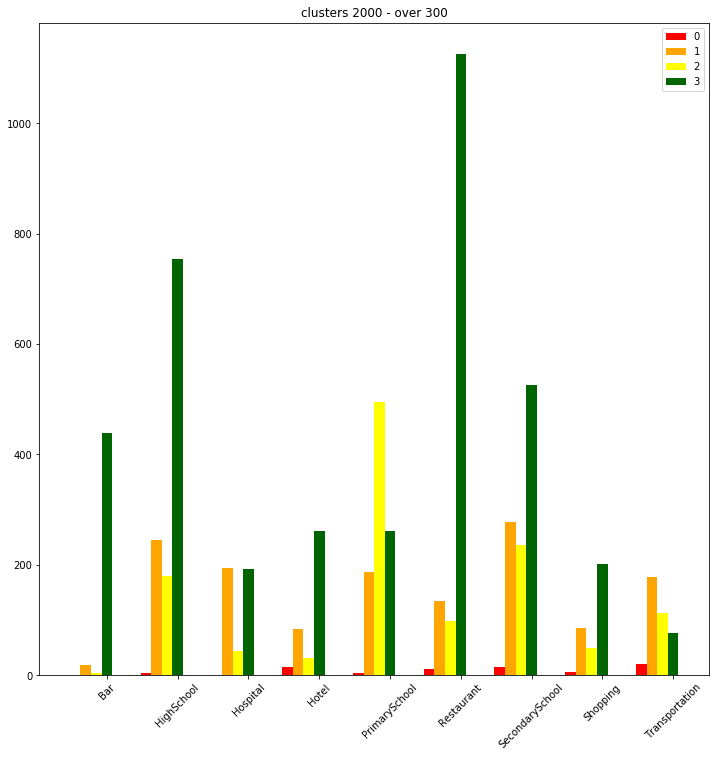

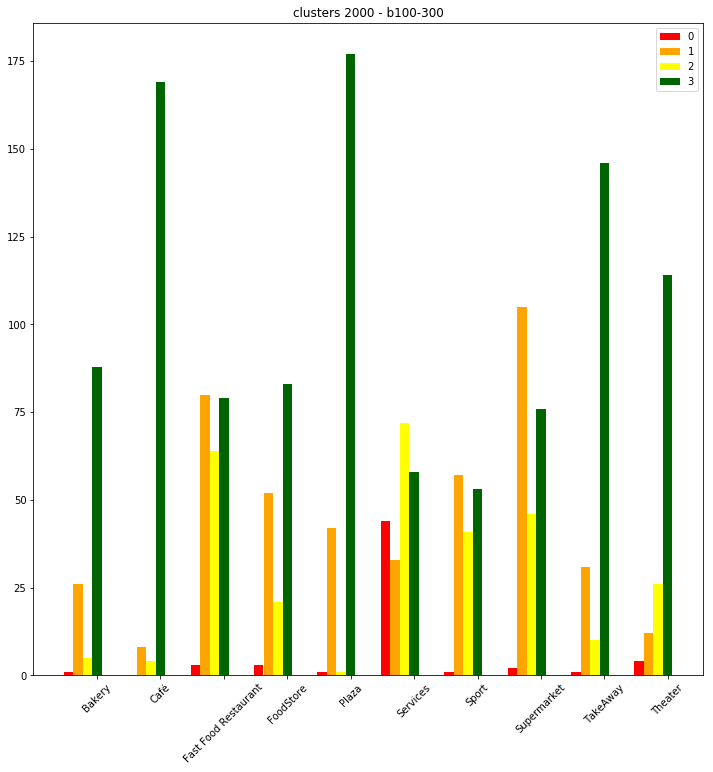

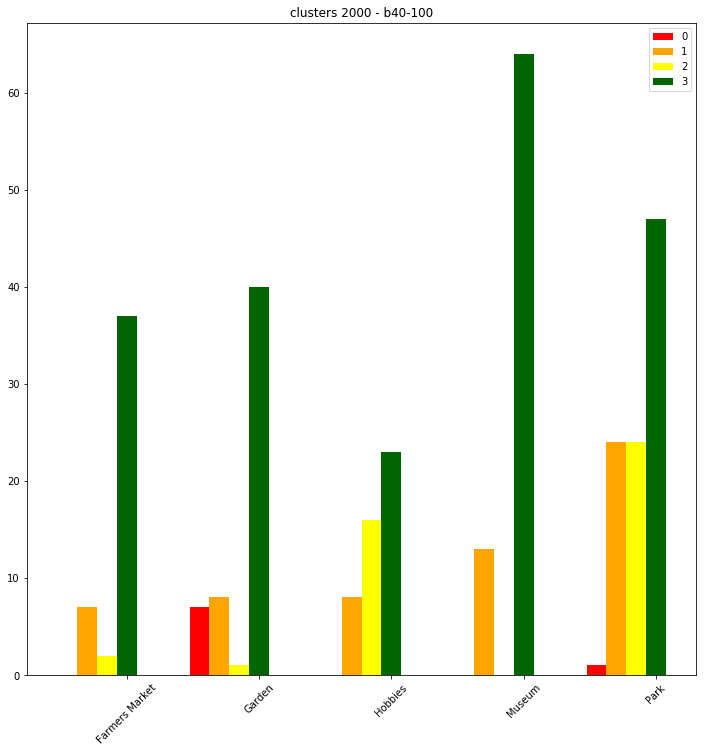

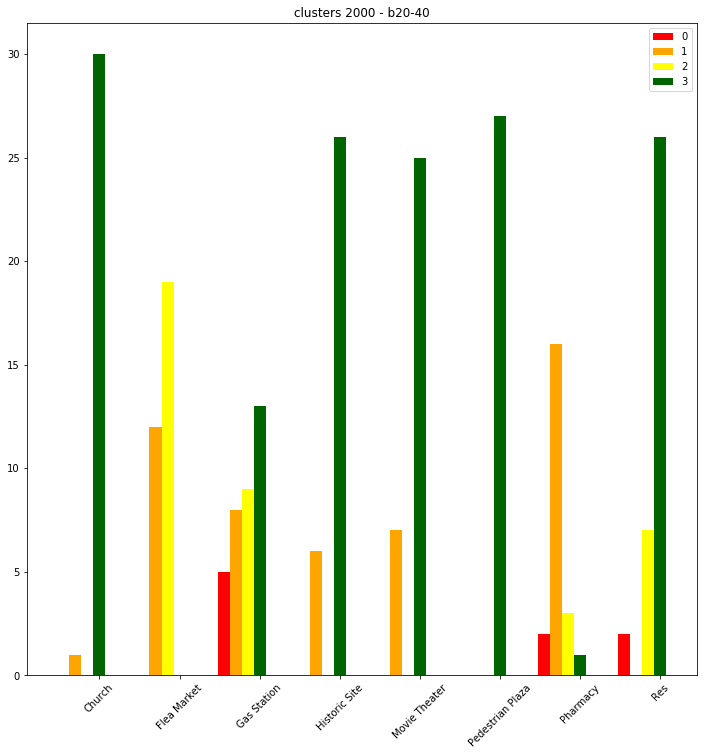

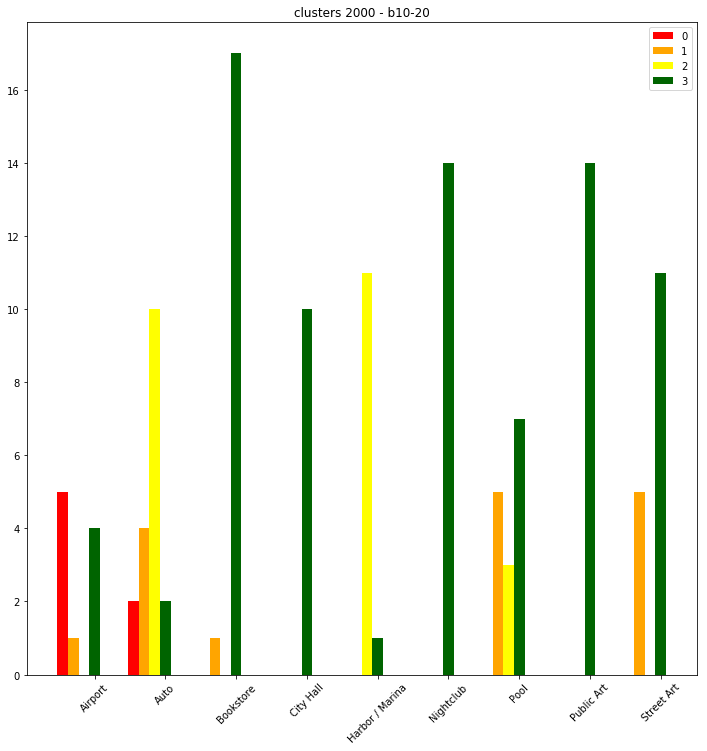

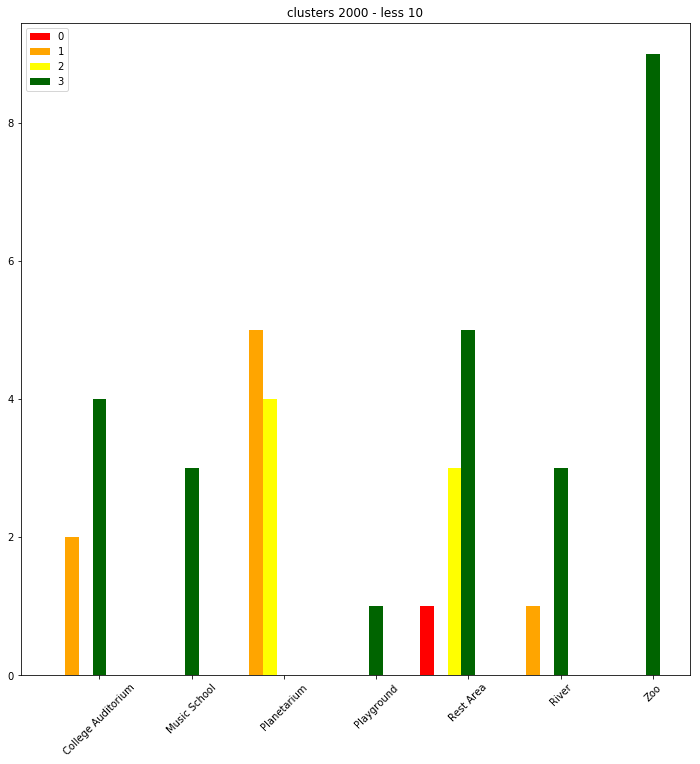

In [192]:
affichegroupe(clusters_2000_over300, 'clusters 2000 - over 300', 12, 4)
affichegroupe(clusters_2000_beetween100_300, 'clusters 2000 - b100-300', 12, 4)
affichegroupe(clusters_2000_beetween40_100, 'clusters 2000 - b40-100', 12, 4)
affichegroupe(clusters_2000_beetween20_40, 'clusters 2000 - b20-40', 12, 4)
affichegroupe(clusters_2000_beetween10_20, 'clusters 2000 - b10-20', 12, 4)
affichegroupe(clusters_2000_less10, 'clusters 2000 - less 10', 12, 4)

In [195]:
clusters_1500_over150 = group_over(lyon_groupe4_1500, 150)
clusters_1500_beetween50_150 = group_beetween(lyon_groupe4_1500, 50, 150)
clusters_1500_beetween15_50 = group_beetween(lyon_groupe4_1500, 15, 50)
clusters_1500_beetween10_15 = group_beetween(lyon_groupe4_1500, 10, 15)
clusters_1500_beetween5_10 = group_beetween(lyon_groupe4_1500, 5, 10)
clusters_1500_less5 = group_less (lyon_groupe4_1500, 5)

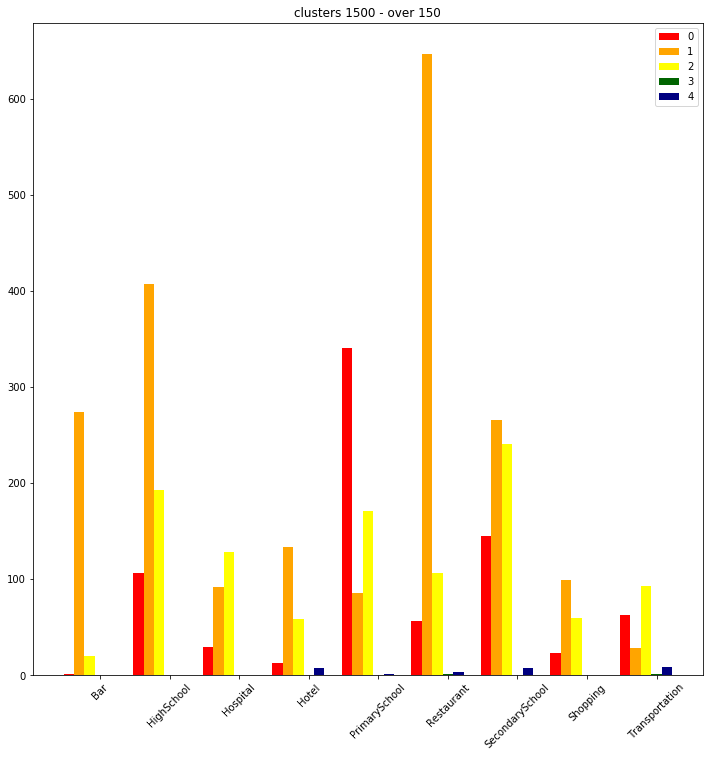

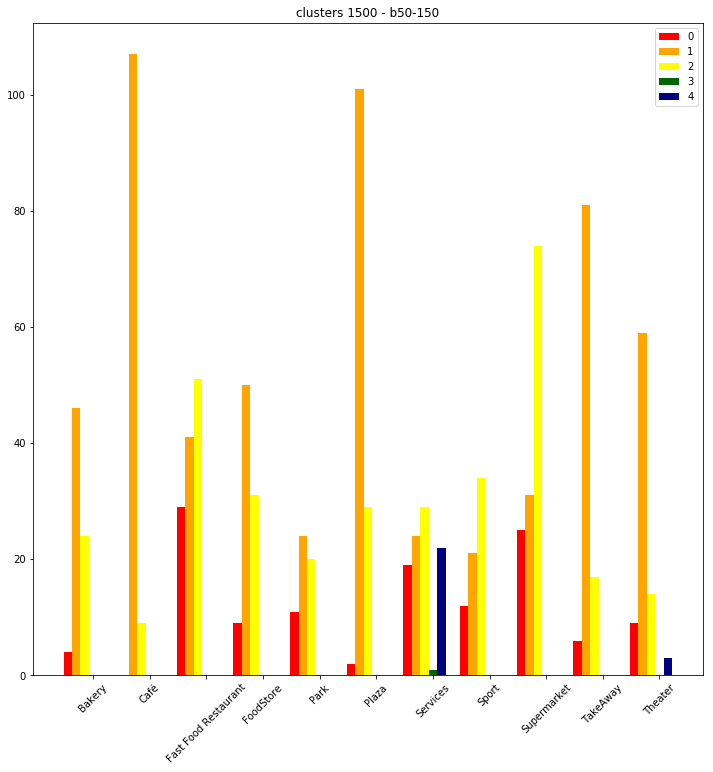

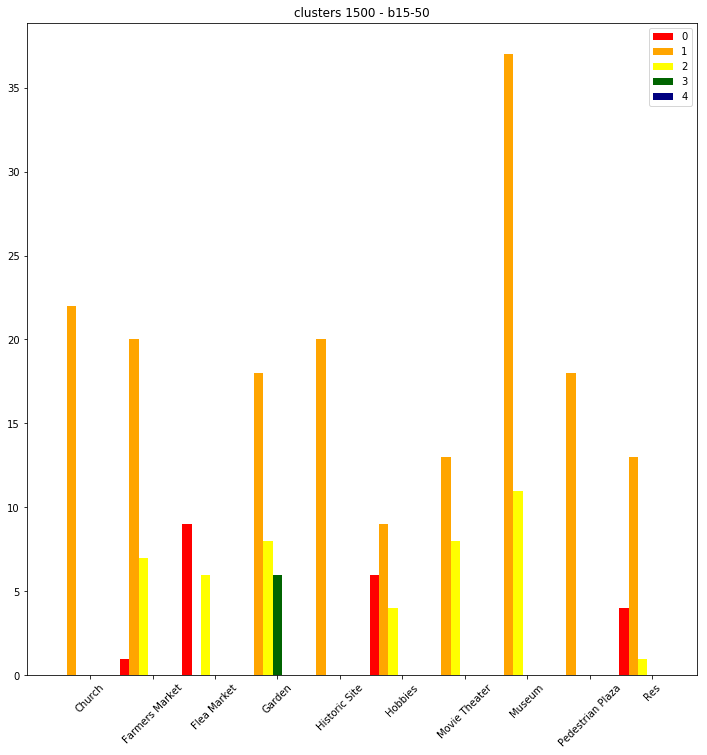

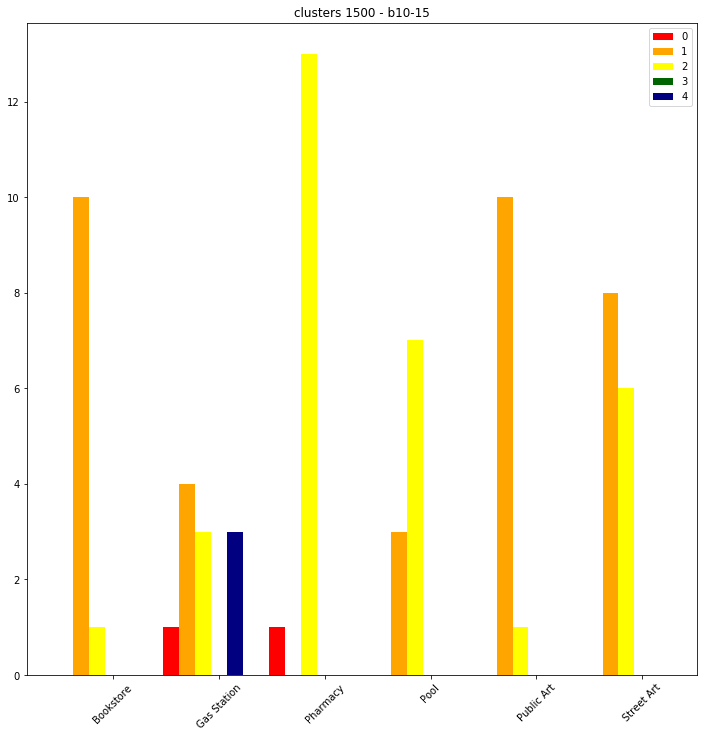

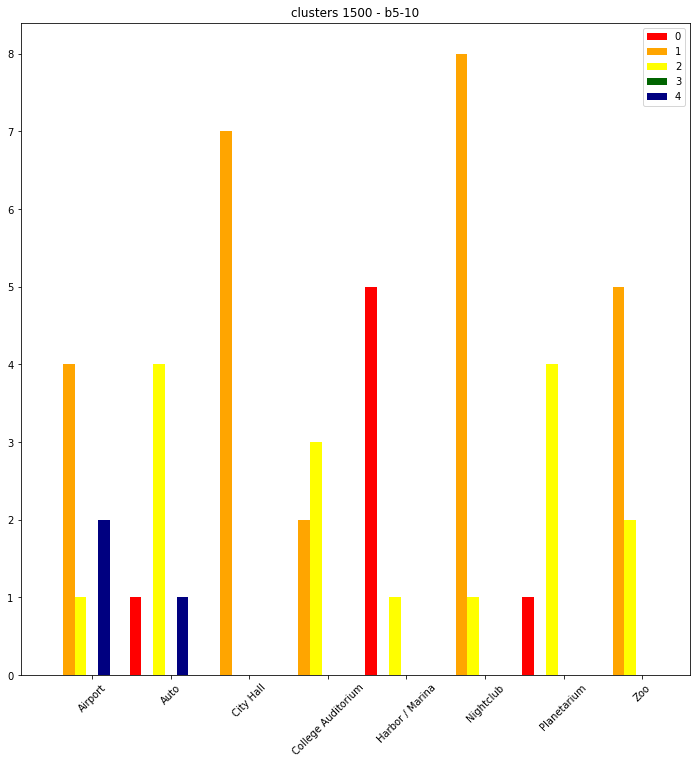

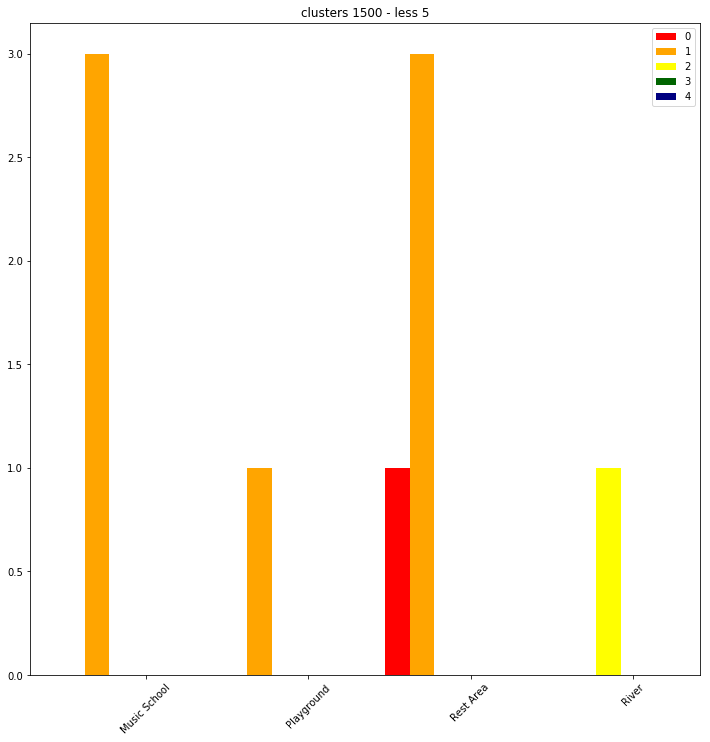

In [196]:
nbClust = 5
affichegroupe(clusters_1500_over150, 'clusters 1500 - over 150', 12, nbClust)
affichegroupe(clusters_1500_beetween50_150, 'clusters 1500 - b50-150', 12, nbClust)
affichegroupe(clusters_1500_beetween15_50, 'clusters 1500 - b15-50', 12, nbClust)
affichegroupe(clusters_1500_beetween10_15, 'clusters 1500 - b10-15', 12, nbClust)
affichegroupe(clusters_1500_beetween5_10, 'clusters 1500 - b5-10', 12, nbClust)
affichegroupe(clusters_1500_less5, 'clusters 1500 - less 5', 12, nbClust)

In [199]:
clusters_1000_over100 = group_over(lyon_groupe4_1000, 100)
clusters_1000_beetween50_100 = group_beetween(lyon_groupe4_1000, 50, 100)
clusters_1000_beetween20_50 = group_beetween(lyon_groupe4_1000, 20, 50)
clusters_1000_beetween10_20 = group_beetween(lyon_groupe4_1000, 10, 20)
clusters_1000_beetween5_10 = group_beetween(lyon_groupe4_1000, 5, 10)
clusters_1000_less5 = group_less (lyon_groupe4_1000, 5)

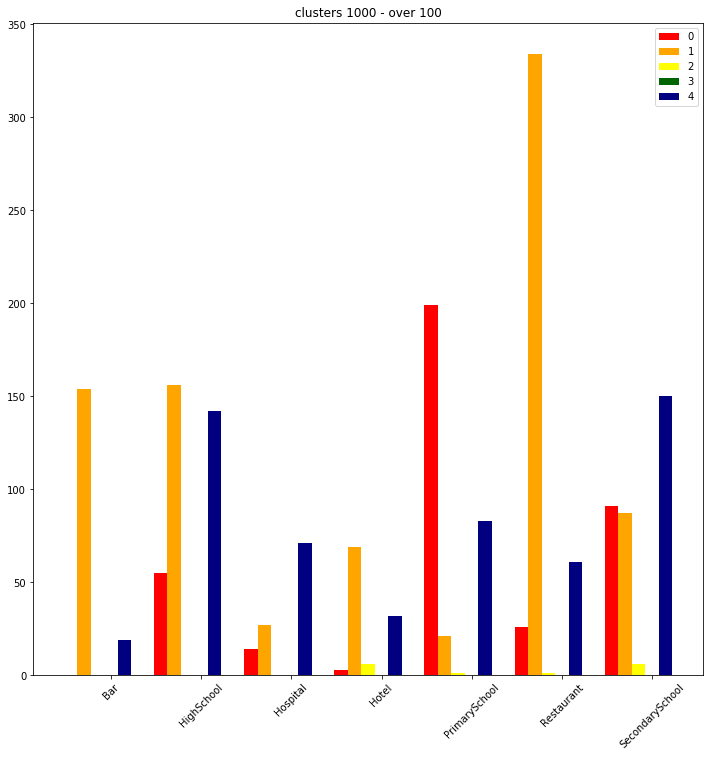

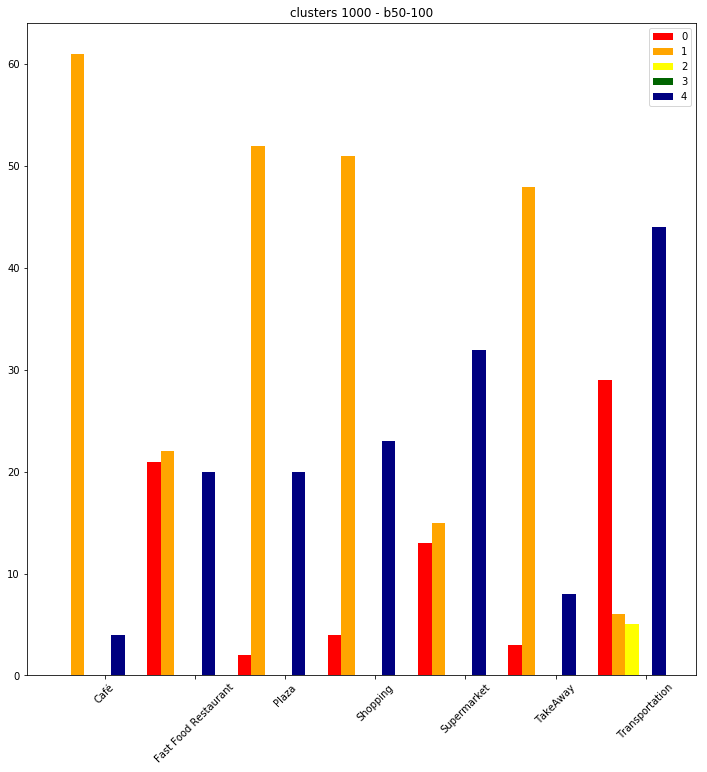

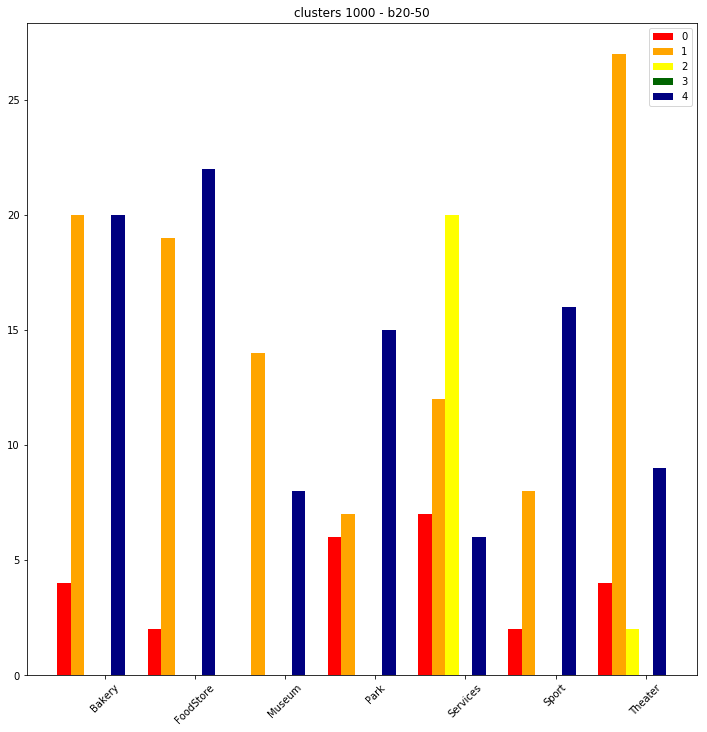

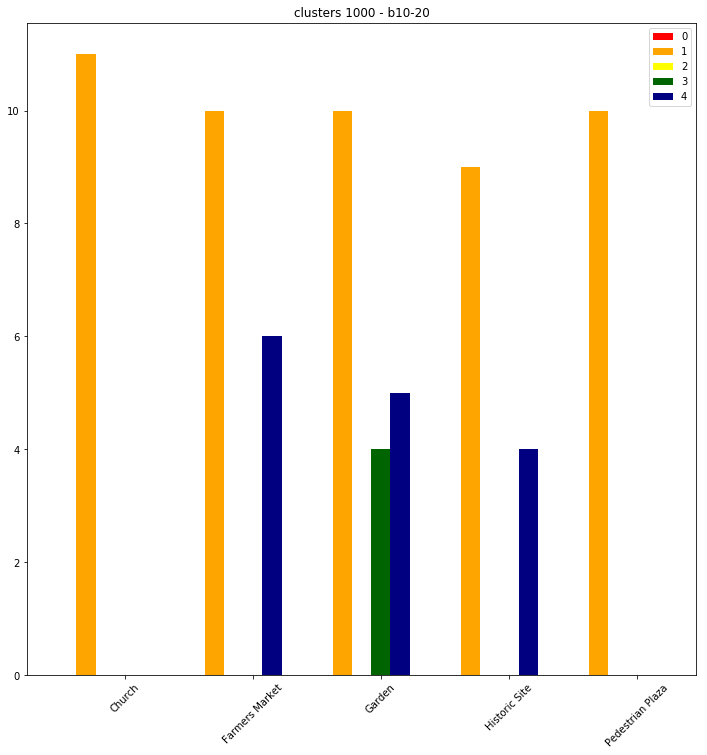

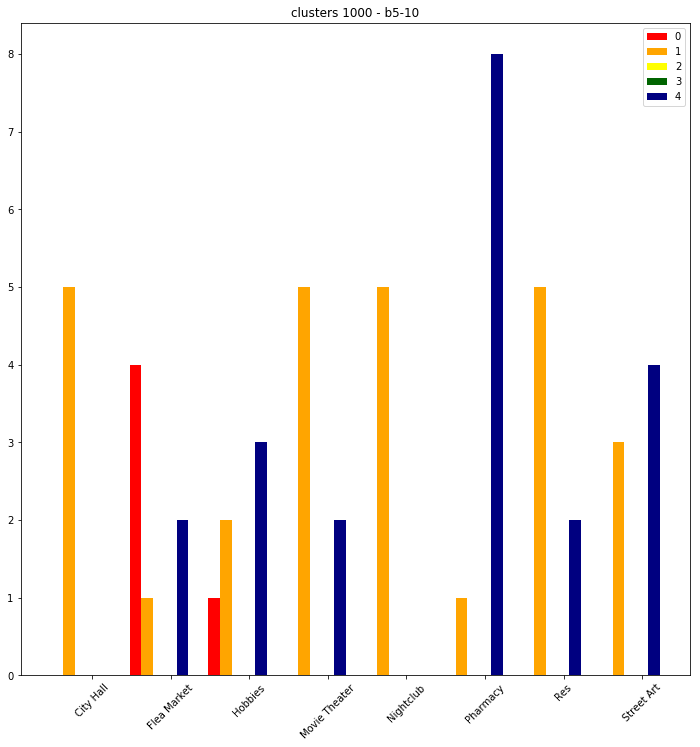

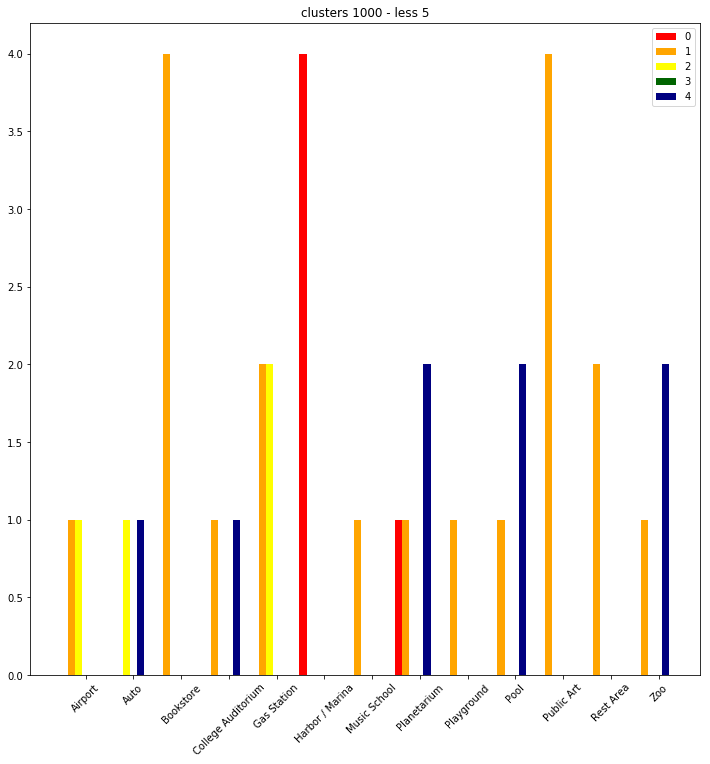

In [200]:
nbClust = 5
affichegroupe(clusters_1000_over100, 'clusters 1000 - over 100', 12, nbClust)
affichegroupe(clusters_1000_beetween50_100, 'clusters 1000 - b50-100', 12, nbClust)
affichegroupe(clusters_1000_beetween20_50, 'clusters 1000 - b20-50', 12, nbClust)
affichegroupe(clusters_1000_beetween10_20, 'clusters 1000 - b10-20', 12, nbClust)
affichegroupe(clusters_1000_beetween5_10, 'clusters 1000 - b5-10', 12, nbClust)
affichegroupe(clusters_1000_less5, 'clusters 1000 - less 5', 12, nbClust)

In [205]:
clusters_750_over50 = group_over(lyon_groupe4_750, 50)
clusters_750_beetween20_50 = group_beetween(lyon_groupe4_750, 20, 50)
clusters_750_beetween8_20 = group_beetween(lyon_groupe4_750, 8, 20)
clusters_750_beetween3_8 = group_beetween(lyon_groupe4_750, 3, 8)
clusters_750_less3 = group_less (lyon_groupe4_750, 3)

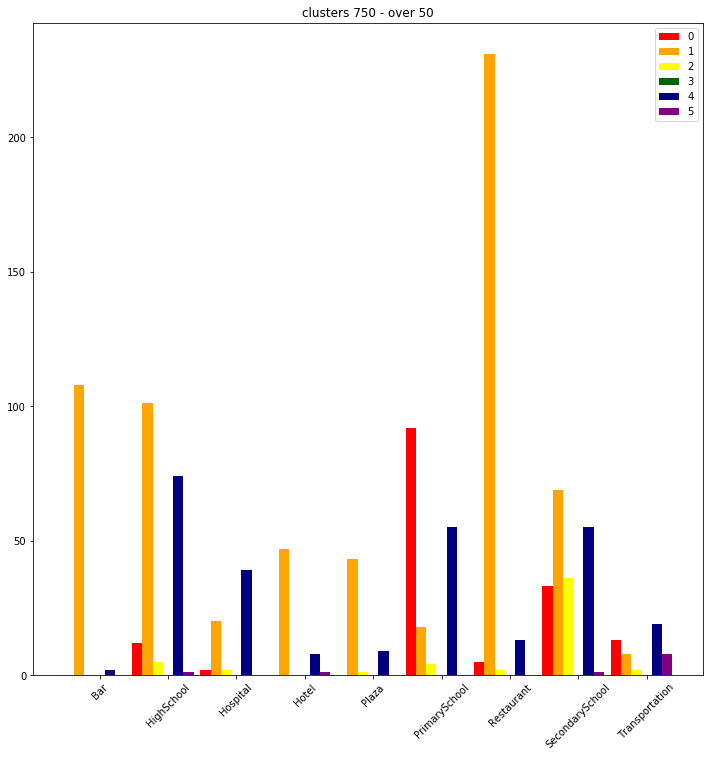

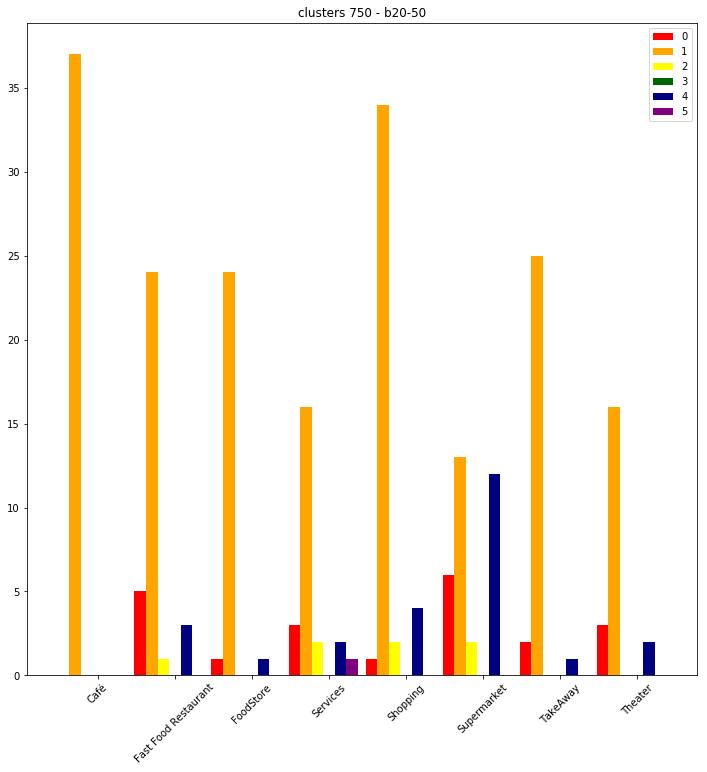

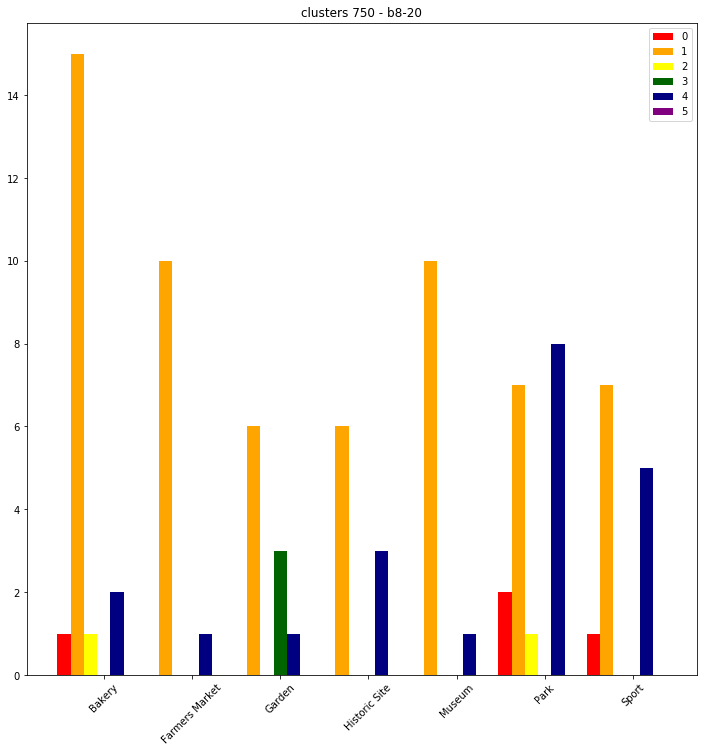

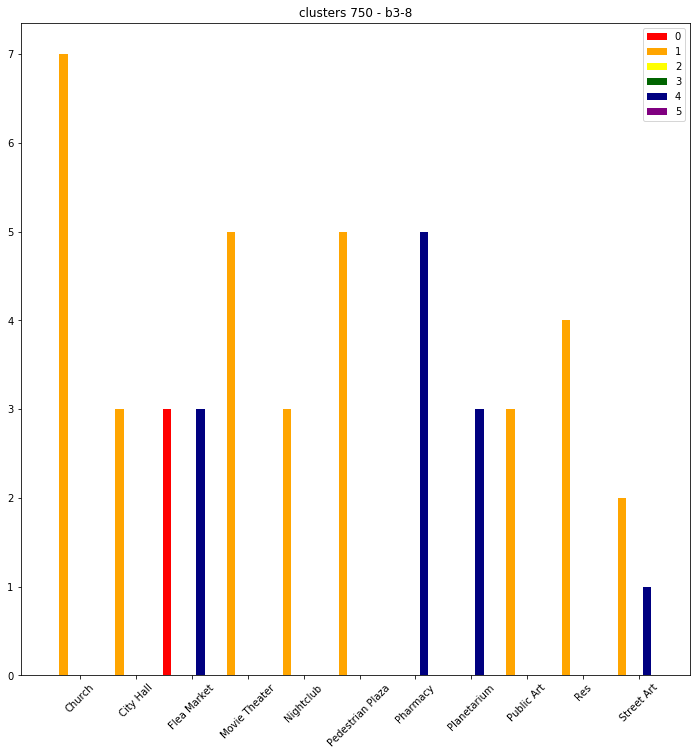

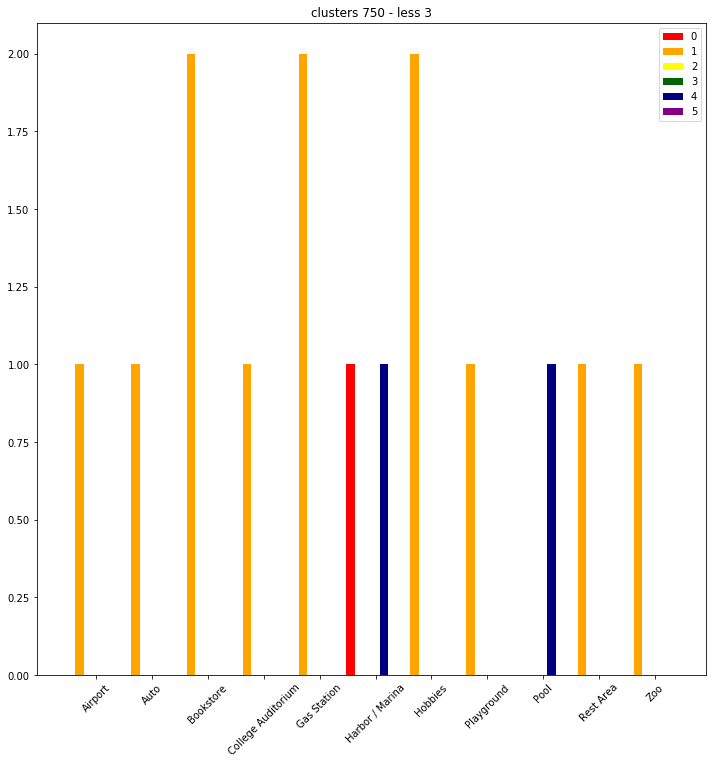

In [206]:
nbClust = 6
affichegroupe(clusters_750_over50, 'clusters 750 - over 50', 12, nbClust)
affichegroupe(clusters_750_beetween20_50, 'clusters 750 - b20-50', 12, nbClust)
affichegroupe(clusters_750_beetween8_20, 'clusters 750 - b8-20', 12, nbClust)
affichegroupe(clusters_750_beetween3_8, 'clusters 750 - b3-8', 12, nbClust)
affichegroupe(clusters_750_less3, 'clusters 750 - less 3', 12, nbClust)

In [211]:
clusters_500_over25 = group_over(lyon_groupe4_500, 25)
clusters_500_beetween12_25 = group_beetween(lyon_groupe4_500, 12, 25)
clusters_500_beetween4_12 = group_beetween(lyon_groupe4_500, 4, 12)
clusters_500_beetween2_4 = group_beetween(lyon_groupe4_500, 2, 4)
clusters_500_less2 = group_less (lyon_groupe4_500, 2)

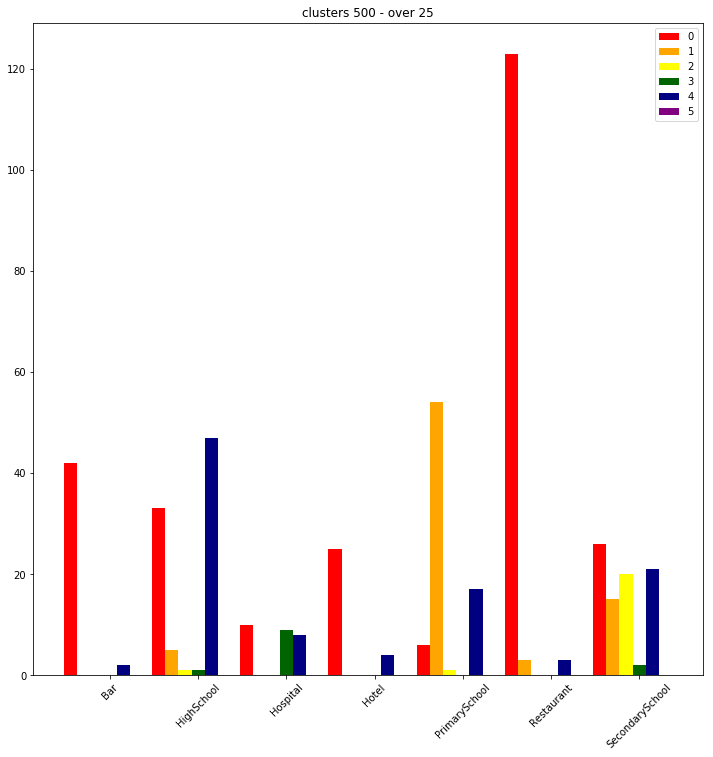

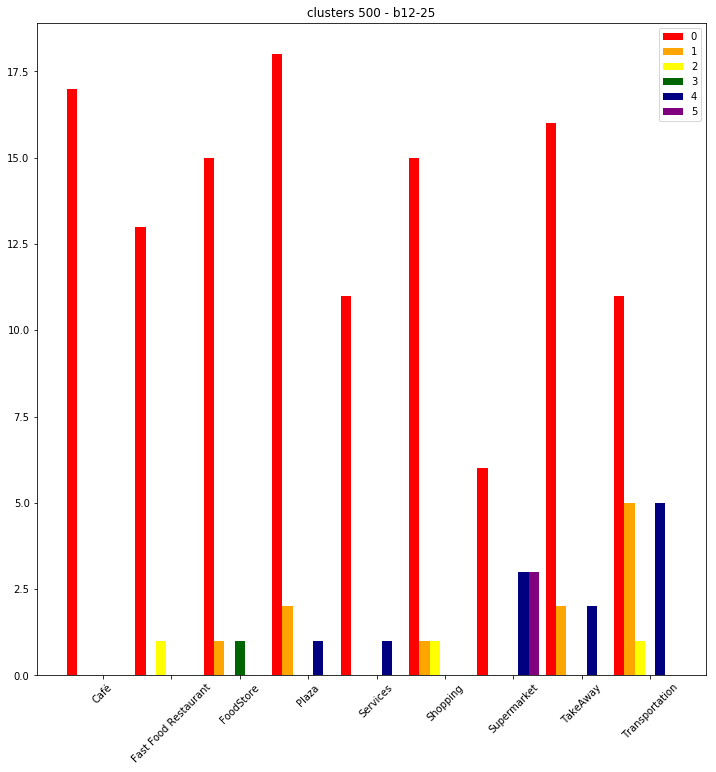

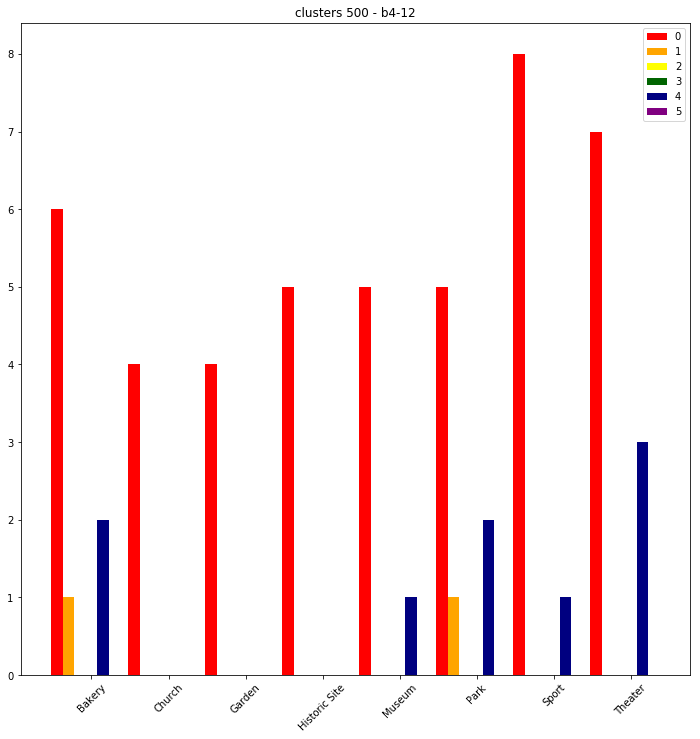

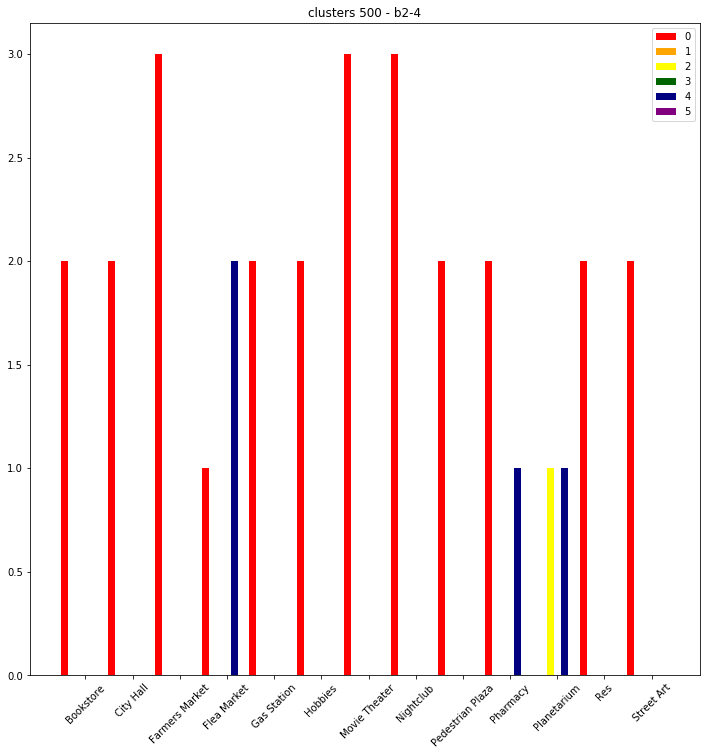

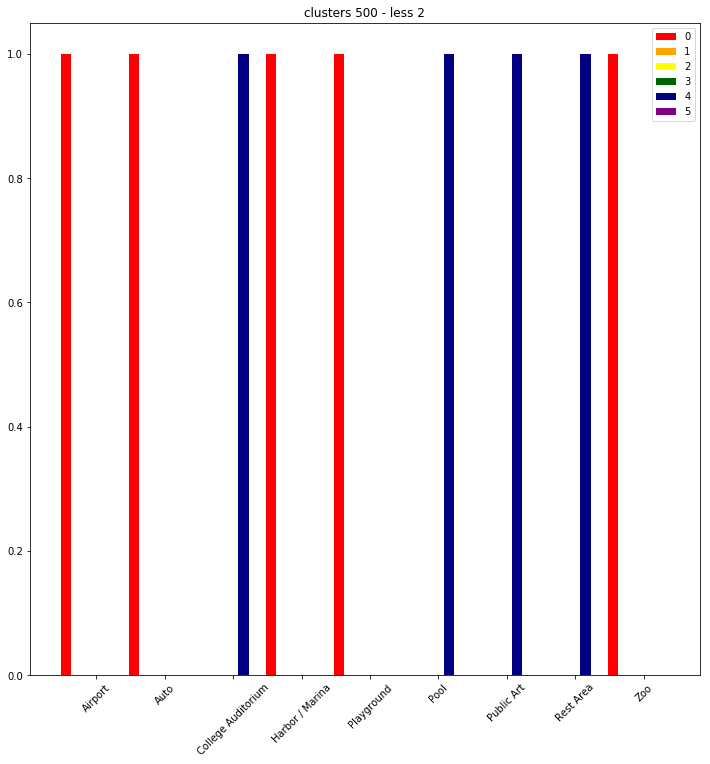

In [212]:
nbClust = 6
affichegroupe(clusters_500_over25, 'clusters 500 - over 25', 12, nbClust)
affichegroupe(clusters_500_beetween12_25, 'clusters 500 - b12-25', 12, nbClust)
affichegroupe(clusters_500_beetween4_12, 'clusters 500 - b4-12', 12, nbClust)
affichegroupe(clusters_500_beetween2_4, 'clusters 500 - b2-4', 12, nbClust)
affichegroupe(clusters_500_less2, 'clusters 500 - less 2', 12, nbClust)

In [222]:
clusters_250_over8 = group_over(lyon_groupe4_250, 8)
clusters_250_beetween3_8 = group_beetween(lyon_groupe4_250, 3, 8)
clusters_250_beetween2_3 = group_beetween(lyon_groupe4_250, 2, 3)
clusters_250_less2 = group_less (lyon_groupe4_250, 2)

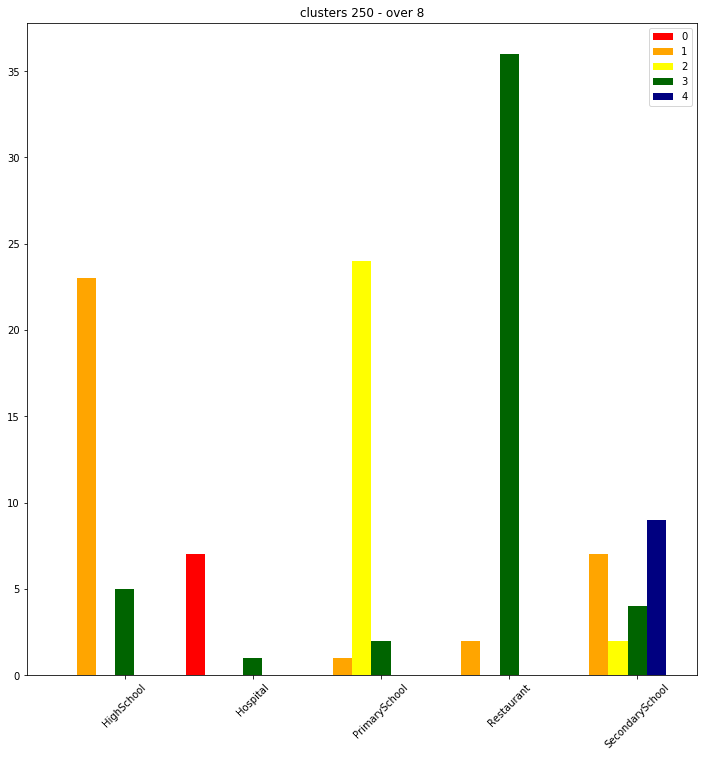

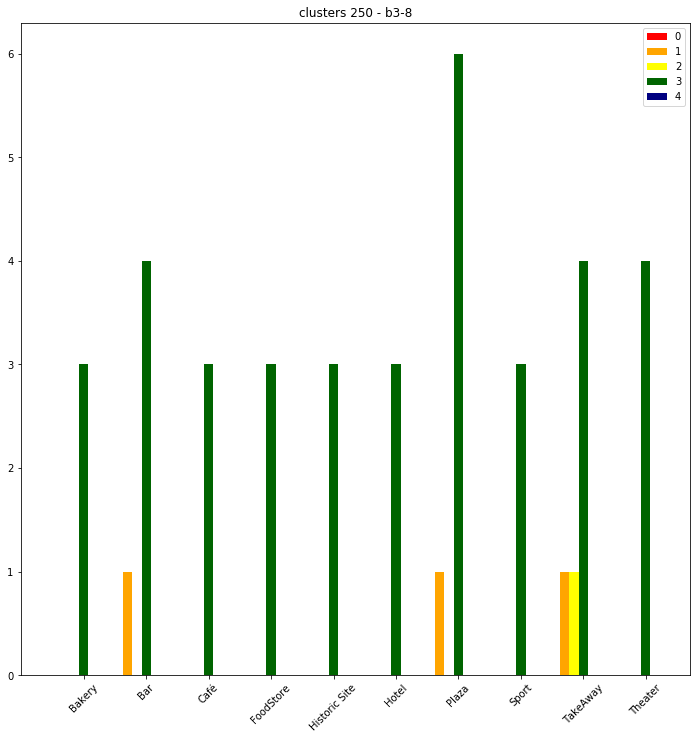

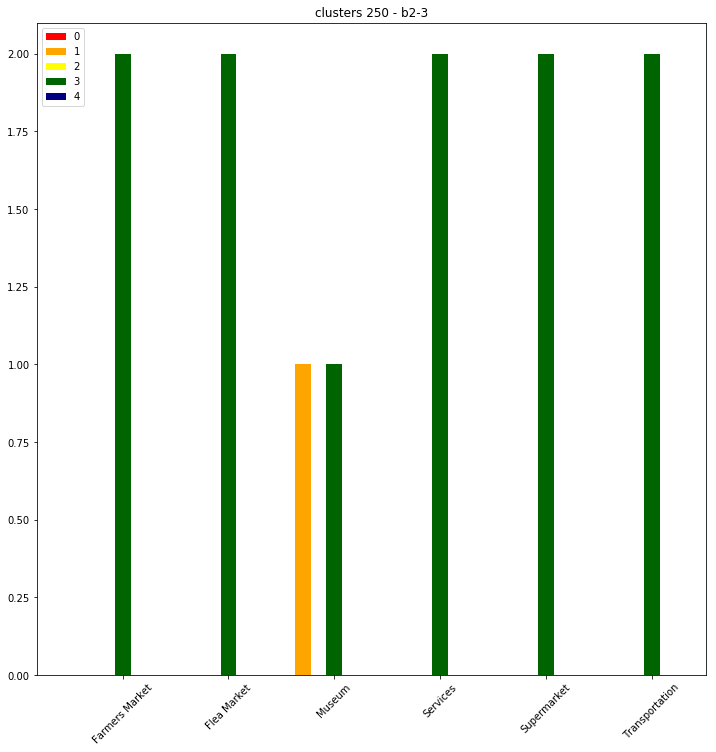

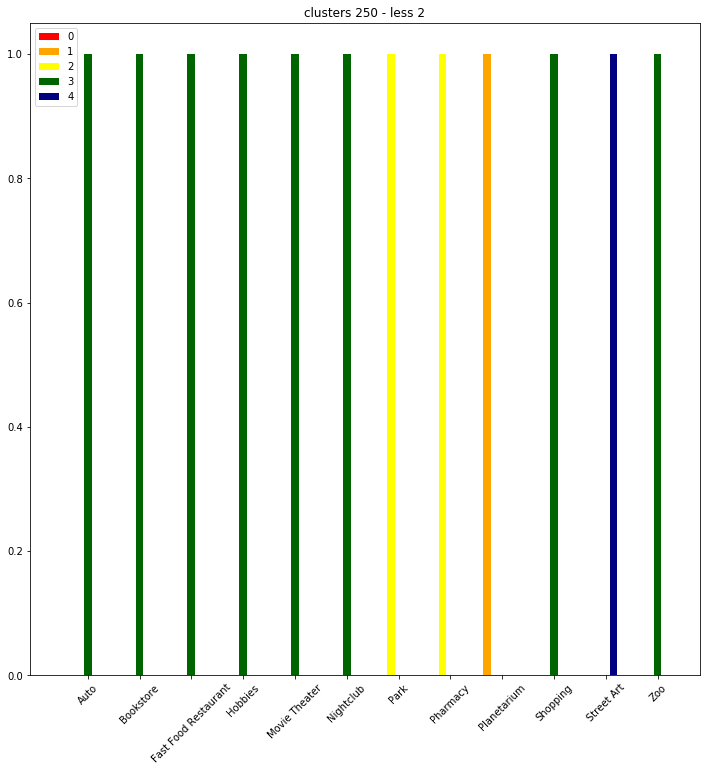

In [223]:
nbClust = 5
affichegroupe(clusters_250_over8, 'clusters 250 - over 8', 12, nbClust)
affichegroupe(clusters_250_beetween3_8, 'clusters 250 - b3-8', 12, nbClust)
affichegroupe(clusters_250_beetween2_3, 'clusters 250 - b2-3', 12, nbClust)
affichegroupe(clusters_250_less2, 'clusters 250 - less 2', 12, nbClust)